# Imports

In [ ]:
! ls

final_union_polyline_3d.npy  male_head2.ply  sample_data


In [ ]:
!pip install shapely

In [ ]:
pip install --upgrade open3d

In [ ]:
!pip install --upgrade pyvirtualdisplay
!apt-get install -y xvfb mesa-utils libgl1-mesa-glx
# Set the XDG_RUNTIME_DIR environment variable
# This directory is used by some XDG-compliant applications for temporary files.
# It needs to be unique per user/session and writable.
# tempfile.mkdtemp() creates a unique temporary directory.
import tempfile
import os
xdg_runtime_dir = tempfile.mkdtemp()
os.environ['XDG_RUNTIME_DIR'] = xdg_runtime_dir
print(f"XDG_RUNTIME_DIR set to: {os.environ['XDG_RUNTIME_DIR']}")


# Set the DISPLAY environment variable for Open3D to use the virtual display
os.environ['DISPLAY'] = ':99'

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
mesa-utils is already the newest version (8.4.0-1ubuntu1).
libgl1-mesa-glx is already the newest version (23.0.4-0ubuntu1~22.04.1).
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.15).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
XDG_RUNTIME_DIR set to: /tmp/tmphu2vbb27


In [ ]:
pip install ipympl

In [ ]:
pip install  --upgrade  open3d

In [ ]:
!pip install ipympl


In [ ]:
import importlib.util
import sys
#spec = importlib.util.spec_from_file_location("open3d", "/usr/local/bin/Open3D/python/open3d/__init__.py")
#o3d = importlib.util.module_from_spec(spec)
#sys.modules['open3d'] = o3d
#spec.loader.exec_module(o3d)
#o3d.__init__('o3d')

In [ ]:
import open3d as o3d
import plotly.graph_objects as go
import numpy as np

In [ ]:
dir(o3d)

['__DEVICE_API__',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 '__warningregistry__',
 '_build_config',
 '_jupyter_labextension_paths',
 '_jupyter_nbextension_paths',
 '_ml3d',
 '_pybind_cuda',
 'camera',
 'core',
 'cpu',
 'data',
 'geometry',
 'io',
 'ml',
 'open3d',
 'pipelines',
 'platform',
 'pybind',
 're',
 'shell',
 't',
 'utility',
 'visualization']

# Load mesh

In [ ]:
#!gdown https://drive.google.com/uc?id=1_GI9biW6XvgJjkCSZeN8oZcqPIjRBQVv

#!gdown https://drive.google.com/uc?id=1stR6_utfnEtOnmFx-CXm1nNq4OSjgw77
!gdown https://drive.google.com/uc?id=1rgsgjzqCc3uRCY7sqs93vePAqu2WNAuq

Downloading...
From: https://drive.google.com/uc?id=1rgsgjzqCc3uRCY7sqs93vePAqu2WNAuq
To: /content/male_head2.ply
100% 982k/982k [00:00<00:00, 20.8MB/s]


In [ ]:
mesh = o3d.io.read_triangle_mesh("male_head2.ply")
#if mesh.is_empty(): exit()

In [ ]:
if not mesh.has_vertex_normals(): mesh.compute_vertex_normals()
if not mesh.has_triangle_normals(): mesh.compute_triangle_normals()

In [ ]:
import open3d as o3d
import numpy as np

# Load your mesh (or create a dummy one with complex issues)
# For demonstration, let's load a mesh from a file if you have one, or continue with sphere with hole
# If you have an STL or OBJ file:
# mesh_with_hole = o3d.io.read_triangle_mesh("your_mesh_file.stl")
# If continuing with the generated sphere with hole:
#mesh = o3d.geometry.TriangleMesh.create_sphere(radius=1.0)
#mesh.compute_vertex_normals()
triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)
triangles_to_keep = []
for i, tri in enumerate(triangles):
    v_coords = vertices[tri]
    if not any(v[2] > 0.9 for v in v_coords):
        triangles_to_keep.append(tri)
mesh_with_hole = o3d.geometry.TriangleMesh(vertices=o3d.utility.Vector3dVector(vertices),
                                           triangles=o3d.utility.Vector3iVector(np.array(triangles_to_keep)))
mesh_with_hole.compute_vertex_normals()


print(f"Mesh before robust cleaning: {len(np.asarray(mesh_with_hole.vertices))} vertices, {len(np.asarray(mesh_with_hole.triangles))} triangles.")
print(f"Initial watertight check: {mesh_with_hole.is_watertight()}")
print(f"Initial boundary loops detected: {len(mesh_with_hole.get_non_manifold_edges(True))}")

# Perform robust cleaning
mesh_cleaned = mesh_with_hole.remove_duplicated_vertices()
mesh_cleaned.remove_degenerate_triangles()
mesh_cleaned.remove_unreferenced_vertices()

# Try merging close vertices - can help close tiny gaps or merge almost-duplicate vertices
# Adjust the tolerance based on your mesh's scale and desired precision
# This can sometimes fix non-manifold edges that are due to very small gaps
print(f"Number of vertices before merge_close_vertices: {len(np.asarray(mesh_cleaned.vertices))}")
mesh_cleaned.merge_close_vertices(eps=1e-3) # Experiment with 'eps' (epsilon)
print(f"Number of vertices after merge_close_vertices: {len(np.asarray(mesh_cleaned.vertices))}")

# Orient triangles consistently (important for many algorithms, especially Poisson)
mesh_cleaned.orient_triangles()

print(f"Mesh after robust cleaning: {len(np.asarray(mesh_cleaned.vertices))} vertices, {len(np.asarray(mesh_cleaned.triangles))} triangles.")
print(f"Watertight check after cleaning: {mesh_cleaned.is_watertight()}")
print(f"Boundary loops detected after cleaning: {len(mesh_cleaned.get_non_manifold_edges(True))}")

# Now try the iterative fill_hole again on mesh_cleaned
# (The iterative fill_hole logic from the previous answer should be applied here)
# ... [Insert the iterative fill_hole code block here, using `mesh_cleaned` as the input] ...

Mesh before robust cleaning: 21534 vertices, 39836 triangles.
Initial watertight check: False
Initial boundary loops detected: 0
Number of vertices before merge_close_vertices: 20096
Number of vertices after merge_close_vertices: 20096
Mesh after robust cleaning: 20096 vertices, 39836 triangles.
Watertight check after cleaning: False
Boundary loops detected after cleaning: 0


In [ ]:
mesh=mesh_cleaned
triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)
colors = None
if mesh.has_triangle_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(mesh.triangle_normals) * 0.5
    colors = tuple(map(tuple, colors))
else:
    colors = (1.0, 0.0, 0.0)

In [ ]:
fig = go.Figure(
    data=[
        go.Mesh3d(
            x=vertices[:,0],
            y=vertices[:,1],
            z=vertices[:,2],
            i=triangles[:,0],
            j=triangles[:,1],
            k=triangles[:,2],
            facecolor=colors,
            opacity=0.50)
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=False),
            yaxis=dict(visible=False),
            zaxis=dict(visible=False)
        )
    )
)
fig.show()

# Compute plane of symmetry

In [ ]:
#print('voxelization')
voxel_grid = o3d.geometry.VoxelGrid.create_from_triangle_mesh(mesh,
                                                              voxel_size=0.25)
#o3d.visualization.draw_geometries([voxel_grid])
vertices_original = np.asarray(mesh.vertices)
triangles_original = np.asarray(mesh.triangles)

In [ ]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots # Although not directly used for subplots here, it's a common Plotly import

# --- Your Voxelization and PCA/Symmetry Plane Calculation (unchanged) ---

# Assuming 'mesh' is your original triangle mesh (or create a dummy one)
#mesh = o3d.geometry.TriangleMesh.create_box()
#mesh.scale(2, center=mesh.get_center())
#voxel_grid = o3d.geometry.VoxelGrid.create_from_triangle_mesh(mesh, voxel_size=0.05)

# Extract vertices and triangles from the original mesh for Plotly


# Define some basic colors for the mesh (e.g., light blue)
colors = ['rgba(0, 0, 255, 0.5)' for _ in range(len(triangles_original))]

# Re-run PCA to get best_plane (essential for the plane's parameters)
occupied_voxels = voxel_grid.get_voxels()

if not occupied_voxels:
    print("No occupied voxels found in the grid.")
#    exit()

voxel_coords_grid_indices = np.asarray([voxel.grid_index for voxel in occupied_voxels])
voxel_size = voxel_grid.voxel_size
origin = voxel_grid.origin
voxel_coords_world = voxel_coords_grid_indices * voxel_size + origin + voxel_size / 2

center_of_mass = np.mean(voxel_coords_world, axis=0)
centered_coords = voxel_coords_world - center_of_mass

covariance_matrix = np.cov(centered_coords, rowvar=False)
eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)

sorted_indices = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[sorted_indices]
eigenvectors = eigenvectors[:, sorted_indices]

candidate_planes = []
for i in range(3):
    normal = eigenvectors[:, i]
    D = np.dot(normal, center_of_mass)
    candidate_planes.append({'normal': normal, 'D': D, 'axis_index': i + 1})

def count_mismatched_voxels(voxel_grid, plane_normal, plane_D):
    mismatched_count = 0
    occupied_voxel_indices = set(tuple(v.grid_index) for v in voxel_grid.get_voxels())

    for voxel in voxel_grid.get_voxels():
        voxel_center_world = np.array(voxel.grid_index) * voxel_grid.voxel_size + voxel_grid.origin + voxel_grid.voxel_size / 2
        signed_distance = np.dot(voxel_center_world, plane_normal) - plane_D
        reflected_voxel_center_world = voxel_center_world - 2 * signed_distance * plane_normal
        reflected_grid_index_float = (reflected_voxel_center_world - voxel_grid.origin - voxel_grid.voxel_size / 2) / voxel_grid.voxel_size
        reflected_grid_index = np.rint(reflected_grid_index_float).astype(int)

        if tuple(reflected_grid_index) not in occupied_voxel_indices:
            mismatched_count += 1
    return mismatched_count

best_plane = None
min_mismatches = float('inf')

for plane_info in candidate_planes:
    normal = plane_info['normal']
    D = plane_info['D']
    axis_index = plane_info['axis_index']

    mismatches = count_mismatched_voxels(voxel_grid, normal, D)

    if mismatches < min_mismatches:
        min_mismatches = mismatches
        best_plane = plane_info

if not best_plane:
    print("Could not determine a best plane of symmetry.")
    exit()

print(f"\n🎉 Best Plane of Symmetry Selected:")
print(f"  Normal Vector: {best_plane['normal']}")
print(f"  D (Offset from Origin): {best_plane['D']:.4f}")
print(f"  Orthogonal to Principal Axis: {best_plane['axis_index']}")
print(f"  Lowest Mismatched Voxels: {min_mismatches}")

# --- End of Plane Fitting Part ---



## Visualization Function




def plot_mesh_and_plane(
    mesh_vertices, mesh_triangles, mesh_colors,
    plane_normal, plane_d_value, plane_center_point,
    voxel_grid_bounds, plot_title="3D Object with Symmetry Plane"
):
    """
    Generates and displays a Plotly 3D graph showing a mesh object and a symmetry plane.

    Args:
        mesh_vertices (np.ndarray): NxD array of vertex coordinates for the main object.
        mesh_triangles (np.ndarray): Mx3 array of triangle indices for the main object.
        mesh_colors (list): List of colors for each face of the main object mesh.
        plane_normal (np.ndarray): 3-element vector representing the normal of the plane.
        plane_d_value (float): The 'D' value (offset from origin) of the plane equation (Ax+By+Cz-D=0).
        plane_center_point (np.ndarray): 3-element vector, a point on the plane (e.g., center of mass).
        voxel_grid_bounds (np.ndarray): 3-element array representing the max_bound - min_bound of the voxel grid,
                                        used to scale the plane size.
        plot_title (str): Title for the Plotly graph.
    """

    # --- 1. Generate Plane Mesh for Plotly ---
    plane_size = np.max(voxel_grid_bounds) * 1.5 # Make the plane larger than the object

    # Create basis vectors for the plane (orthogonal to normal)
    # Handle cases where normal is close to Z-axis to avoid zero cross product
    if np.allclose(plane_normal, [0,0,1]) or np.allclose(plane_normal, [0,0,-1]):
        v1 = np.array([1.0, 0.0, 0.0])
        v2 = np.array([0.0, 1.0, 0.0])
    else:
        v1 = np.cross(plane_normal, np.array([0.0, 0.0, 1.0]))
        v1 = v1 / np.linalg.norm(v1) # Normalize v1
        v2 = np.cross(plane_normal, v1)
        v2 = v2 / np.linalg.norm(v2) # Normalize v2

    half_size = plane_size / 2.0
    p1 = plane_center_point + half_size * v1 + half_size * v2
    p2 = plane_center_point - half_size * v1 + half_size * v2
    p3 = plane_center_point - half_size * v1 - half_size * v2
    p4 = plane_center_point + half_size * v1 - half_size * v2

    plane_vertices = np.array([p1, p2, p3, p4])
    plane_triangles = np.array([[0, 1, 2], [0, 2, 3]]) # Two triangles for a quad

    # --- 2. Create Plotly Figure ---
    fig = go.Figure(
        data=[
            # Trace for your original object (or its voxelized mesh)
            go.Mesh3d(
                x=mesh_vertices[:,0],
                y=mesh_vertices[:,1],
                z=mesh_vertices[:,2],
                i=mesh_triangles[:,0],
                j=mesh_triangles[:,1],
                k=mesh_triangles[:,2],
                facecolor=mesh_colors, # Apply colors (e.g., rgba light blue)
                opacity=0.4,       # Make it slightly transparent
                name='3D Object',
                showlegend=True
            ),
            # Trace for the symmetry plane
            go.Mesh3d(
                x=plane_vertices[:,0],
                y=plane_vertices[:,1],
                z=plane_vertices[:,2],
                i=plane_triangles[:,0],
                j=plane_triangles[:,1],
                k=plane_triangles[:,2],
                color='red', # A distinct color for the plane
                opacity=0.7, # Make the plane more opaque
                name='Symmetry Plane',
                showlegend=True
            )
        ],
        layout=dict(
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False),
                aspectmode='data' # Important for correct aspect ratio in 3D
            ),
            title=plot_title
        )
    )

    fig.show()


🎉 Best Plane of Symmetry Selected:
  Normal Vector: [ 0.99987226 -0.00841424 -0.01358922]
  D (Offset from Origin): 0.2276
  Orthogonal to Principal Axis: 2
  Lowest Mismatched Voxels: 7366


In [ ]:
# --- Call the visualization function after plane fitting ---

# Ensure you have these variables from your plane fitting part:
# vertices_original, triangles_original, colors (for the mesh)
# best_plane['normal'], best_plane['D'] (for the plane parameters)
# center_of_mass (for a point on the plane)
# voxel_grid.get_max_bound() - voxel_grid.get_min_bound() (for plane sizing)

plot_mesh_and_plane(
    mesh_vertices=vertices_original,
    mesh_triangles=triangles_original,
    mesh_colors=colors,
    plane_normal=best_plane['normal'],
    plane_d_value=best_plane['D'],
    plane_center_point=center_of_mass, # This is a point on the plane
    voxel_grid_bounds=(voxel_grid.get_max_bound() - voxel_grid.get_min_bound()),
    plot_title="Mesh with Its Best Symmetry Plane"
)

In [ ]:
#plane1_normal=best_plane['normal']

# Find ears

In [ ]:

def find_farthest_points_from_plane(mesh_vertices, plane_normal, plane_D):
    """
    Identifies the two points in the mesh that are farthest from the plane,
    one on each side of the plane.

    Args:
        mesh_vertices (np.ndarray): NxD array of vertex coordinates for the mesh.
        plane_normal (np.ndarray): 3-element vector representing the normal of the plane.
        plane_D (float): The 'D' value (offset from origin) of the plane equation (Ax+By+Cz-D=0).

    Returns:
        tuple: (farthest_pos_point, farthest_neg_point)
               Each is a np.ndarray (3-element vector) representing the coordinates
               of the farthest point on that side. Returns (None, None) if no points
               are found on either side.
    """
    if len(mesh_vertices) == 0:
        return None, None

    # Calculate signed distances for all vertices
    # d = (P . N) - D
    signed_distances = np.dot(mesh_vertices, plane_normal) - plane_D

    # Find the vertex with the maximum positive distance
    positive_distances = signed_distances[signed_distances >= 0]
    positive_indices = np.where(signed_distances >= 0)[0]

    farthest_pos_point = None
    if len(positive_distances) > 0:
        max_pos_dist_idx_local = np.argmax(positive_distances)
        farthest_pos_point = mesh_vertices[positive_indices[max_pos_dist_idx_local]]

    # Find the vertex with the minimum (most negative) distance
    negative_distances = signed_distances[signed_distances < 0]
    negative_indices = np.where(signed_distances < 0)[0]

    farthest_neg_point = None
    if len(negative_distances) > 0:
        min_neg_dist_idx_local = np.argmin(negative_distances)
        farthest_neg_point = mesh_vertices[negative_indices[min_neg_dist_idx_local]]

    return farthest_pos_point, farthest_neg_point

# --- Call the new function after best_plane is determined ---
farthest_pos_point, farthest_neg_point = find_farthest_points_from_plane(
    mesh_vertices=vertices_original,
    plane_normal=best_plane['normal'],
    plane_D=best_plane['D']
)

print("\n--- Farthest Points from Symmetry Plane ---")
if farthest_pos_point is not None:
    print(f"Farthest point on positive side: {farthest_pos_point}")
else:
    print("No points found on the positive side of the plane.")

if farthest_neg_point is not None:
    print(f"Farthest point on negative side: {farthest_neg_point}")
else:
    print("No points found on the negative side of the plane.")

# Calculate the distance between the two points
distance_between_farthest_points = np.linalg.norm(farthest_pos_point - farthest_neg_point)

print(f"The distance between these two farthest points is: {distance_between_farthest_points:.4f}")




--- Farthest Points from Symmetry Plane ---
Farthest point on positive side: [  9.4536314  -21.93988228   0.70939064]
Farthest point on negative side: [ -9.51612473 -21.98750496   0.7823087 ]
The distance between these two farthest points is: 18.9700


In [ ]:
# --- Calculate Average of Farthest Points ---
# Ensure farthest_pos_point and farthest_neg_point are available from previous calculations
if farthest_pos_point is not None and farthest_neg_point is not None:
    average_farthest_point = (farthest_pos_point + farthest_neg_point) / 2
    print(f"\nAverage of farthest points: {average_farthest_point}")
else:
    print("\nWarning: Could not calculate average of farthest points (one or both are None).")
    # Handle this case, e.g., by exiting or setting a default.
    # For now, let's assume they are available for demonstration purposes.
    # If they are None, the subsequent calculation will fail.
    exit() # Exit if we cannot proceed with plane calculation

# --- Define the given point ---
given_point = np.array([0.0, -22, -10])

# --- Calculate the normal for the new plane ---
# Vector between the two points on the new plane
vector_P1_P2 = average_farthest_point - given_point

# Normal of the previously identified symmetry plane
normal_symmetry_plane = best_plane['normal']

# The new plane's normal is orthogonal to both the symmetry plane's normal
# and the vector connecting the two points on the new plane.
# So, use the cross product.
normal_new_plane = np.cross(normal_symmetry_plane, vector_P1_P2)

# Normalize the new plane's normal vector
if np.linalg.norm(normal_new_plane) > 1e-6: # Check for non-zero norm
    normal_new_plane = normal_new_plane / np.linalg.norm(normal_new_plane)
else:
    print("Error: The calculated normal for the new plane is a zero vector. Points might be collinear with symmetry normal.")
    # This can happen if vector_P1_P2 is parallel to normal_symmetry_plane.
    # This implies the two points lie on a line parallel to the symmetry plane's normal,
    # and also within the symmetry plane itself. This is an edge case.
    exit()

# Calculate the D value for the new plane using one of its points (e.g., given_point)
D_new_plane = np.dot(normal_new_plane, given_point)

print(f"\n--- Identified New Orthogonal Plane ---")
print(f"Normal of new orthogonal plane: {normal_new_plane}")
print(f"D value of new orthogonal plane: {D_new_plane:.4f}")


Average of farthest points: [ -0.03124666 -21.96369362   0.74584967]

--- Identified New Orthogonal Plane ---
Normal of new orthogonal plane: [-0.00836939 -0.99995935  0.00335417]
D value of new orthogonal plane: 21.9656


In [ ]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

# --- (Your existing PCA and Plane Fitting Code remains unchanged above this point) ---

# --- Visualization Function (Modified to show axes) ---

def plot_objects_and_planes(
    mesh_vertices, mesh_triangles, mesh_colors,
    plane1_normal, plane1_d_value, plane1_center_point,
    voxel_grid_bounds,
    farthest_points=None,
    plane2_normal=None, plane2_d_value=None, plane2_center_point=None,
    plot_title="3D Object with Symmetry Planes"
):
    """
    Generates and displays a Plotly 3D graph showing a mesh object and one or two symmetry planes.
    Optionally plots farthest points and displays XYZ axes.

    Args:
        mesh_vertices (np.ndarray): NxD array of vertex coordinates for the main object.
        mesh_triangles (np.ndarray): Mx3 array of triangle indices for the main object.
        mesh_colors (list): List of colors for each face of the main object mesh.
        plane1_normal (np.ndarray): 3-element vector representing the normal of the first plane.
        plane1_d_value (float): The 'D' value of the first plane equation.
        plane1_center_point (np.ndarray): 3-element vector, a point on the first plane.
        voxel_grid_bounds (np.ndarray): 3-element array representing the max_bound - min_bound,
                                        used to scale the plane size.
        farthest_points (tuple, optional): A tuple (farthest_pos_point, farthest_neg_point) to plot.
                                           Defaults to None.
        plane2_normal (np.ndarray, optional): Normal of the second plane.
        plane2_d_value (float, optional): D value of the second plane.
        plane2_center_point (np.ndarray, optional): A point on the second plane.
        plot_title (str): Title for the Plotly graph.
    """

    # --- Helper to generate plane mesh vertices and triangles ---
    def generate_plane_mesh_data(normal, center_point, bounds, opacity, color, name):
        plane_size = np.max(bounds) * 1.5
        if np.allclose(normal, [0,0,1]) or np.allclose(normal, [0,0,-1]):
            v1 = np.array([1.0, 0.0, 0.0])
            v2 = np.array([0.0, 1.0, 0.0])
        else:
            v1 = np.cross(normal, np.array([0.0, 0.0, 1.0]))
            v1 = v1 / np.linalg.norm(v1)
            v2 = np.cross(normal, v1)
            v2 = v2 / np.linalg.norm(v2)

        half_size = plane_size / 2.0
        p1 = center_point + half_size * v1 + half_size * v2
        p2 = center_point - half_size * v1 + half_size * v2
        p3 = center_point - half_size * v1 - half_size * v2
        p4 = center_point + half_size * v1 - half_size * v2

        plane_vertices = np.array([p1, p2, p3, p4])
        plane_triangles = np.array([[0, 1, 2], [0, 2, 3]])

        return go.Mesh3d(
            x=plane_vertices[:,0], y=plane_vertices[:,1], z=plane_vertices[:,2],
            i=plane_triangles[:,0], j=plane_triangles[:,1], k=plane_triangles[:,2],
            color=color, opacity=opacity, name=name, showlegend=True
        )

    # --- Create Plotly Figure ---
    data_traces = [
        # Trace for your original object (or its voxelized mesh)
        go.Mesh3d(
            x=mesh_vertices[:,0],
            y=mesh_vertices[:,1],
            z=mesh_vertices[:,2],
            i=mesh_triangles[:,0],
            j=mesh_triangles[:,1],
            k=mesh_triangles[:,2],
            facecolor=mesh_colors,
            opacity=0.4,
            name='3D Object',
            showlegend=True
        )
    ]

    # Add the first symmetry plane (previously identified)
    data_traces.append(
        generate_plane_mesh_data(
            normal=plane1_normal,
            center_point=plane1_center_point,
            bounds=voxel_grid_bounds,
            opacity=0.7,
            color='red', # Main symmetry plane
            name='Symmetry Plane 1'
        )
    )

    # Add the second orthogonal plane if its data is provided
    if plane2_normal is not None and plane2_d_value is not None and plane2_center_point is not None:
        data_traces.append(
            generate_plane_mesh_data(
                normal=plane2_normal,
                center_point=plane2_center_point,
                bounds=voxel_grid_bounds,
                opacity=0.6, # Slightly different opacity
                color='green', # New orthogonal plane
                name='Orthogonal Plane'
            )
        )

    # Add farthest points if provided
    if farthest_points and farthest_points[0] is not None and farthest_points[1] is not None:
        farthest_pos, farthest_neg = farthest_points

        farthest_x = [farthest_pos[0], farthest_neg[0]]
        farthest_y = [farthest_pos[1], farthest_neg[1]]
        farthest_z = [farthest_pos[2], farthest_neg[2]]

        data_traces.append(
            go.Scatter3d(
                x=farthest_x,
                y=farthest_y,
                z=farthest_z,
                mode='markers',
                marker=dict(
                    size=8,
                    color=['blue', 'purple'], # Differentiating colors
                    symbol='circle',
                    opacity=0.9
                ),
                name='Farthest Points',
                showlegend=True,
                text=['Farthest Positive Side', 'Farthest Negative Side'],
                hoverinfo='text'
            )
        )

    fig = go.Figure(
        data=data_traces,
        layout=dict(
            scene=dict(
                # Make axes visible and add titles
                xaxis=dict(visible=True, title='X-axis', showgrid=True, zeroline=True),
                yaxis=dict(visible=True, title='Y-axis', showgrid=True, zeroline=True),
                zaxis=dict(visible=True, title='Z-axis', showgrid=True, zeroline=True),
                aspectmode='data'
            ),
            title=plot_title
        )
    )

    fig.show()

# --- (Your existing calls to the visualization function remain unchanged below this point) ---
# Example call (assuming all required variables are defined from previous code)
# plot_objects_and_planes(
#     mesh_vertices=vertices_original,
#     mesh_triangles=triangles_original,
#     mesh_colors=colors,
#     plane1_normal=best_plane['normal'],
#     plane1_d_value=best_plane['D'],
#     plane1_center_point=center_of_mass,
#     voxel_grid_bounds=(voxel_grid.get_max_bound() - voxel_grid.get_min_bound()),
#     farthest_points=(farthest_pos_point, farthest_neg_point),
#     plane2_normal=normal_new_plane,
#     plane2_d_value=D_new_plane,
#     plane2_center_point=given_point,
#     plot_title="Object with Two Symmetry Planes and Farthest Points"
# )

In [ ]:
# --- Call the visualization function after all calculations ---

plot_objects_and_planes(
    mesh_vertices=vertices_original,
    mesh_triangles=triangles_original,
    mesh_colors=colors,
    plane1_normal=best_plane['normal'],
    plane1_d_value=best_plane['D'],
    plane1_center_point=center_of_mass, # center_of_mass is on the first symmetry plane
    voxel_grid_bounds=(voxel_grid.get_max_bound() - voxel_grid.get_min_bound()),
    farthest_points=(farthest_pos_point, farthest_neg_point),
    plane2_normal=normal_new_plane,
    plane2_d_value=D_new_plane,
    plane2_center_point=given_point, # Use given_point or average_farthest_point as a point on the new plane
    plot_title="Object with Two Symmetry Planes and Farthest Points"
)

# Find eyes

In [ ]:
import numpy as np

# --- Placeholder values for necessary variables (replace with your actual calculated values) ---
# Assuming these are defined from your earlier steps:
# Example best_plane, normal_new_plane, farthest_pos_point, farthest_neg_point, given_point
#best_plane = {'normal': np.array([0.0, 0.0, 1.0]), 'D': 0.0} # Example: XY plane
#normal_new_plane = np.array([1.0, 0.0, 0.0]) # Example: YZ plane
#farthest_pos_point = np.array([1.0, 2.0, 3.0])
#farthest_neg_point = np.array([-1.0, -2.0, -3.0])
#given_point = np.array([0.5, 0.5, 0.5]) # Explicitly defined point for plane2
# --- End of placeholder values ---

# --- 1. Calculate the New Point ---
# New point is 1/3 of the way from farthest_pos_point to farthest_neg_point
new_point = farthest_pos_point + (1/3) * (farthest_neg_point - farthest_pos_point)
print(f"The new point is: {new_point}")

# --- 2. Calculate the Direction of the Intersection Line between Plane1 and Plane2 ---
plane1_normal = best_plane['normal']
plane2_normal = normal_new_plane

# Calculate the cross product to get the direction of the intersection line
intersection_line_direction_unnormalized = np.cross(plane1_normal, plane2_normal)

# Normalize the direction vector
norm_intersection = np.linalg.norm(intersection_line_direction_unnormalized)

if norm_intersection < 1e-6: # Check if planes are parallel or nearly parallel
    print("Warning: Planes are parallel or nearly parallel, their intersection is not a single line or is ill-defined.")
    intersection_line_direction = np.array([0.0, 0.0, 0.0]) # Default to zero vector
    # If this happens, you might need to handle the case where no unique intersection line exists.
    # For a valid ray, we need a non-zero direction.
    ray_final = np.array([0.0, 0.0, 0.0]) # Set final ray to zero if intersection is undefined
else:
    intersection_line_direction = intersection_line_direction_unnormalized / norm_intersection
    print(f"Direction of the intersection line (unoriented): {intersection_line_direction}")

    # --- 3. Orient the Ray ---
    # Ray from new_point to given_point (for plane2)
    ray_ref_unnormalized = given_point - new_point
    norm_ref = np.linalg.norm(ray_ref_unnormalized)

    if norm_ref < 1e-6: # Check if new_point and given_point are coincident or too close
        print("Warning: new_point and given_point are coincident or too close. Cannot orient ray based on this reference.")
        # In this case, we cannot use the dot product for orientation.
        # A reasonable fallback might be to just use the unoriented intersection_line_direction,
        # or to raise an error depending on your application's requirements.
        ray_final = intersection_line_direction # Default to unoriented if reference is invalid
    else:
        ray_ref = ray_ref_unnormalized / norm_ref

        # Check the dot product for orientation
        dot_product_with_positive_dir = np.dot(intersection_line_direction, ray_ref)

        if dot_product_with_positive_dir > 0:
            ray_final = intersection_line_direction
        elif dot_product_with_positive_dir < 0: # If dot product is negative, reverse direction
            ray_final = -intersection_line_direction
        else:
            # If dot_product_with_positive_dir is zero, it means intersection_line_direction is
            # orthogonal to ray_ref. The condition "cos product > 0" cannot be strictly met.
            # We'll default to the positive direction (intersection_line_direction).
            print("Warning: Intersection line is orthogonal to the reference ray. Defaulting to one orientation.")
            ray_final = intersection_line_direction

print(f"The final oriented ray direction is: {ray_final}")

The new point is: [  3.13037936 -21.95575651   0.73369666]
Direction of the intersection line (unoriented): [-0.01361689 -0.00324001 -0.99990204]
The final oriented ray direction is: [-0.01361689 -0.00324001 -0.99990204]


In [ ]:
import open3d as o3d
import numpy as np

# --- 1. Define your mesh, new_point, and ray_final from previous steps ---
# Load a mesh (e.g., a simple sphere for illustration)
#mesh = o3d.geometry.TriangleMesh.create_sphere(radius=1.0)
#mesh.compute_vertex_normals()

# For a more complex test, let's make a hollow sphere or a shape that might have multiple intersections
# For example, by creating a sphere and a smaller internal sphere, then doing a boolean difference
# (Requires Open3D 0.16.0+ for boolean operations on legacy meshes)
# try:
#     sphere_outer = o3d.geometry.TriangleMesh.create_sphere(radius=1.0)
#     sphere_inner = o3d.geometry.TriangleMesh.create_sphere(radius=0.8)
#     sphere_inner.translate([0.1, 0.0, 0.0]) # Offset the inner sphere
#     mesh_with_hole = sphere_outer.boolean_difference(sphere_inner)
#     mesh_with_hole.compute_vertex_normals()
#     print("Created a hollow sphere-like mesh.")
# except AttributeError:
#     print("Boolean operations not available or failed. Using simple sphere with top hole.")
    # Fallback to the previous "sphere with hole" method if boolean ops not available
triangles = np.asarray(mesh.triangles)
vertices = np.asarray(mesh.vertices)
triangles_to_keep = []
for i, tri in enumerate(triangles):
    v_coords = vertices[tri]
    if not any(v[2] > 0.9 for v in v_coords):
        triangles_to_keep.append(tri)
mesh_with_hole = o3d.geometry.TriangleMesh(vertices=o3d.utility.Vector3dVector(vertices),
                                           triangles=o3d.utility.Vector3iVector(np.array(triangles_to_keep)))
mesh_with_hole.compute_vertex_normals()


# Example for new_point and ray_final (replace with your actual calculated values)
# Let ray start outside and pass through the sphere
#new_point = np.array([0.0, 0.0, 2.0]) # Ray origin above the sphere
ray_final = np.array([0.0, 0.0, -1.0]) # Ray direction pointing downwards

print(f"Ray origin (new_point): {new_point}")
print(f"Ray direction (ray_final): {ray_final}")

# --- 2. Convert mesh to open3d.t.geometry.TriangleMesh ---
tensor_mesh = o3d.t.geometry.TriangleMesh.from_legacy(mesh_with_hole)
tensor_mesh = tensor_mesh.to(o3d.core.Device("CPU:0")) # Ensure on CPU

# --- 3. Create a RaycastingScene and add the mesh ---
scene = o3d.t.geometry.RaycastingScene()
# Adding with a name allows you to query by name later if needed, but for one mesh, ID is 0
mesh_id = scene.add_triangles(tensor_mesh)

# --- Finding the Farthest Intersection ---

# Method 1: Iterative search (More robust for complex cases, but not native "farthest hit" directly)
# This simulates finding multiple hits by moving the ray origin after each hit.
# It's an approximation of finding "farthest" for general geometry.

farthest_t_hit = -np.inf # Initialize with negative infinity
farthest_intersection_point = None
current_ray_origin = new_point
initial_ray_direction = ray_final # Keep original ray direction constant

max_iterations = 100 # Limit iterations to prevent infinite loops
iteration_count = 0
found_any_hit = False

# We'll collect all valid intersection points along the ray.
all_intersection_points = []
all_t_hits = []

while iteration_count < max_iterations:
    rays = o3d.core.Tensor([[current_ray_origin[0], current_ray_origin[1], current_ray_origin[2],
                             initial_ray_direction[0], initial_ray_direction[1], initial_ray_direction[2]]],
                           dtype=o3d.core.Dtype.Float32)

    ans = scene.cast_rays(rays)
    t_hit_relative = ans['t_hit'].numpy()[0] # Distance from current_ray_origin

    if np.isinf(t_hit_relative) or t_hit_relative < 1e-6: # No hit or hit at current origin (numerical)
        break # No more intersections found along this path

    # Calculate global t_hit (distance from original new_point)
    hit_point_relative = current_ray_origin + t_hit_relative * initial_ray_direction
    t_hit_global = np.linalg.norm(hit_point_relative - new_point)

    # Ensure direction of t_hit_global is correct if ray_final isn't unit vector or has negative components
    if np.dot(initial_ray_direction, (hit_point_relative - new_point)) < 0:
         t_hit_global *= -1 # Adjust sign if going backwards relative to ray_final


    all_t_hits.append(t_hit_global)
    all_intersection_points.append(hit_point_relative)
    found_any_hit = True

    # Move the ray origin slightly past the current hit point for the next iteration
    # Add a small epsilon to avoid re-hitting the same surface due to floating point precision
    current_ray_origin = hit_point_relative + initial_ray_direction * 1e-4 # Move 0.0001 units along the ray
    iteration_count += 1

if found_any_hit and len(all_t_hits) > 0:
    # Find the largest t_hit among all found intersections
    farthest_t_hit_index = np.argmax(all_t_hits)
    farthest_t_hit = all_t_hits[farthest_t_hit_index]
    farthest_intersection_point = all_intersection_points[farthest_t_hit_index]

    print(f"\nFound {len(all_intersection_points)} intersection(s).")
    print(f"The farthest intersection is at a distance of {farthest_t_hit:.4f} from the ray origin.")
    print(f"The farthest intersection point on the mesh is: {farthest_intersection_point} ✨")
else:
    print("\nNo intersection found between the ray and the mesh (after iterative search). 🚫")
    farthest_intersection_point = None

# --- Optional: Visualize the intersection point with Open3D ---
if farthest_intersection_point is not None:
    # Create a small sphere at the farthest intersection point for visualization
    intersection_sphere = o3d.geometry.TriangleMesh.create_sphere(radius=0.03) # Adjust radius
    intersection_sphere.translate(farthest_intersection_point)
    intersection_sphere.paint_uniform_color([1, 0, 0]) # Red for the farthest intersection

    # Create a line segment for the ray (from origin to farthest intersection)
    ray_line_points = np.array([new_point, farthest_intersection_point])
    ray_line_indices = np.array([[0, 1]])
    ray_line_set = o3d.geometry.LineSet(
        points=o3d.utility.Vector3dVector(ray_line_points),
        lines=o3d.utility.Vector2iVector(ray_line_indices)
    )
    ray_line_set.colors = o3d.utility.Vector3dVector([[0, 0, 1]]) # Blue for the ray

    # You can also add markers for all intersections if needed
    all_hit_spheres = []
    for point in all_intersection_points:
        sphere = o3d.geometry.TriangleMesh.create_sphere(radius=0.015)
        sphere.translate(point)
        sphere.paint_uniform_color([0, 1, 0]) # Green for all hits
        all_hit_spheres.append(sphere)

    # Visualize the mesh, farthest intersection point, ray, and all other hit points
    #geometries_to_draw = [mesh_with_hole, intersection_sphere, ray_line_set] + all_hit_spheres
    #o3d.visualization.draw_geometries(geometries_to_draw, window_name="Farthest Mesh Intersection")

Ray origin (new_point): [  3.13037936 -21.95575651   0.73369666]
Ray direction (ray_final): [ 0.  0. -1.]

Found 3 intersection(s).
The farthest intersection is at a distance of 11.4133 from the ray origin.
The farthest intersection point on the mesh is: [  3.13037936 -21.95575651 -10.67964429] ✨


In [ ]:
import numpy as np

# Assuming these are defined from your previous steps:
# farthest_intersection_point
# new_point (ray origin)
# distance_between_farthest_points

# Example values (replace with your actual calculated values):
#farthest_intersection_point = np.array([0.0, 0.0, -1.0])
#new_point = np.array([0.0, 0.0, 5.0])
#distance_between_farthest_points = 6.0 # Example value, replace with your actual calculation

search_radius = 0.02 * distance_between_farthest_points
print(f"The search radius around the farthest intersection point is: {search_radius:.4f}")

The search radius around the farthest intersection point is: 0.3794


In [ ]:
import open3d as o3d
import numpy as np

# Re-using the mesh and ray definition for demonstration
mesh_with_hole = mesh
mesh_with_hole.compute_vertex_normals()
triangles = np.asarray(mesh_with_hole.triangles)
vertices = np.asarray(mesh_with_hole.vertices)
triangles_to_keep = []
for i, tri in enumerate(triangles):
    v_coords = vertices[tri]
    if not any(v[2] > 0.9 for v in v_coords):
        triangles_to_keep.append(tri)
mesh_with_hole = o3d.geometry.TriangleMesh(vertices=o3d.utility.Vector3dVector(vertices),
                                           triangles=o3d.utility.Vector3iVector(np.array(triangles_to_keep)))
mesh_with_hole.compute_vertex_normals()

# Example values for farthest_intersection_point, new_point, and distance_between_farthest_points
# (Replace with your actual computed values from previous steps)
#farthest_intersection_point = np.array([0.0, 0.0, -1.0]) # Example: bottom of a unit sphere
#new_point = np.array([0.0, 0.0, 5.0]) # Example: ray origin far above
# For a unit sphere and ray from (0,0,5) to (0,0,-1),
# distance_between_farthest_points might be related to the sphere's diameter or overall object extent.
# Let's assume a value based on typical object sizes for demonstration
#distance_between_farthest_points = 2.0 * np.linalg.norm(np.array([0.0, 0.0, 1.0]) - np.array([0.0,0.0,-1.0])) # Approx diameter related to sphere example
# Make sure to use your *actual* `distance_between_farthest_points` here.

#search_radius = 0.03 * distance_between_farthest_points
#print(f"Search radius: {search_radius:.4f}")

# Get all vertices from the mesh
mesh_vertices_np = np.asarray(mesh_with_hole.vertices)

if len(mesh_vertices_np) == 0:
    print("Mesh has no vertices. Cannot find the point.")
    farthest_point_in_radius = None
else:
    max_distance_from_ray_origin_in_radius = -1.0
    farthest_point_in_radius = None

    for vertex in mesh_vertices_np:
        # Check if the vertex is within the search radius of farthest_intersection_point
        distance_to_farthest_intersection = np.linalg.norm(vertex - farthest_intersection_point)

        if distance_to_farthest_intersection <= search_radius:
            # If it's within the radius, calculate its distance from the ray origin (new_point)
            distance_from_ray_origin = np.linalg.norm(vertex - new_point)

            # Check if this is the farthest point found so far within the radius
            if distance_from_ray_origin > max_distance_from_ray_origin_in_radius:
                max_distance_from_ray_origin_in_radius = distance_from_ray_origin
                farthest_point_in_radius = vertex

    if farthest_point_in_radius is not None:
        print(f"\nPoint on mesh surface farthest from ray origin within search radius:")
        print(f"  Coordinates: {farthest_point_in_radius}")
        print(f"  Distance from ray origin ({new_point}): {max_distance_from_ray_origin_in_radius:.4f}")
    else:
        print("\nNo mesh vertices found within the specified search radius of the farthest intersection point. 😬")

# --- Optional: Visualize the result with Plotly ---
# You would integrate this into your existing plot_objects_and_planes function.
# For quick visualization, here's a standalone Plotly snippet:
import plotly.graph_objects as go

fig = go.Figure()

# Add the mesh
fig.add_trace(go.Mesh3d(
    x=np.asarray(mesh_with_hole.vertices)[:,0], y=np.asarray(mesh_with_hole.vertices)[:,1], z=np.asarray(mesh_with_hole.vertices)[:,2],
    i=np.asarray(mesh_with_hole.triangles)[:,0], j=np.asarray(mesh_with_hole.triangles)[:,1], k=np.asarray(mesh_with_hole.triangles)[:,2],
    color='lightgray', opacity=0.5, name='Mesh'
))

# Add the farthest intersection point (reference point for the search radius)
fig.add_trace(go.Scatter3d(
    x=[farthest_intersection_point[0]], y=[farthest_intersection_point[1]], z=[farthest_intersection_point[2]],
    mode='markers',
    marker=dict(size=10, color='red', symbol='x', opacity=1.0),
    name='Farthest Ray Intersection (Reference)',
    text=[f'Ref Point: {farthest_intersection_point}'], hoverinfo='text'
))

# Add the new_point (ray origin)
fig.add_trace(go.Scatter3d(
    x=[new_point[0]], y=[new_point[1]], z=[new_point[2]],
    mode='markers',
    marker=dict(size=10, color='blue', symbol='circle', opacity=1.0),
    name='Ray Origin (New Point)',
    text=[f'Ray Origin: {new_point}'], hoverinfo='text'
))

# Add the calculated farthest point within the radius
if farthest_point_in_radius is not None:
    fig.add_trace(go.Scatter3d(
        x=[farthest_point_in_radius[0]], y=[farthest_point_in_radius[1]], z=[farthest_point_in_radius[2]],
        mode='markers',
        marker=dict(size=15, color='gold', symbol='diamond', opacity=1.0), # CHANGED 'star' to 'diamond'
        name='Farthest Mesh Point in Radius',
        text=[f'Farthest in Radius: {farthest_point_in_radius}'], hoverinfo='text'
    ))

# Optional: Visualize the search radius as a transparent sphere
# You might need to adjust the sphere's resolution for performance
sphere_points = o3d.geometry.TriangleMesh.create_sphere(radius=search_radius, resolution=20)
sphere_points.translate(farthest_intersection_point)
sphere_points.paint_uniform_color([0.2, 0.8, 0.2]) # This Open3D call is fine for Open3D's viewer, but not directly for Plotly's 'color' property

# CORRECTED: Set color directly in the go.Mesh3d trace using a string
fig.add_trace(go.Mesh3d(
    x=np.asarray(sphere_points.vertices)[:,0], y=np.asarray(sphere_points.vertices)[:,1], z=np.asarray(sphere_points.vertices)[:,2],
    i=np.asarray(sphere_points.triangles)[:,0], j=np.asarray(sphere_points.triangles)[:,1], k=np.asarray(sphere_points.triangles)[:,2],
    color='rgb(51, 204, 51)', # Changed to a valid RGB string (a shade of green)
    opacity=0.15,
    name='Search Radius Sphere'
))


fig.update_layout(
    scene=dict(
        xaxis=dict(visible=True, title='X-axis'),
        yaxis=dict(visible=True, title='Y-axis'),
        zaxis=dict(visible=True, title='Z-axis'),
        aspectmode='data'
    ),
    title="Farthest Mesh Point from Ray Origin within Search Radius"
)

fig.show()


Point on mesh surface farthest from ray origin within search radius:
  Coordinates: [  3.23916507 -22.07682991 -10.69650745]
  Distance from ray origin ([  3.13037936 -21.95575651   0.73369666]): 11.4314


In [ ]:
eye_point=farthest_point_in_radius

# Find brow

In [ ]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

# --- (Your existing Voxelization, PCA, Best Plane, Farthest Points, and New Orthogonal Plane Calculation remain unchanged) ---

# --- New Function: Get Plane-Mesh Intersection ---

def get_plane_mesh_intersection(mesh_vertices, mesh_triangles, plane_normal, plane_D, tolerance=1e-6):
    """
    Calculates the intersection polyline(s) of a mesh with a plane.

    Args:
        mesh_vertices (np.ndarray): Nx3 array of mesh vertex coordinates.
        mesh_triangles (np.ndarray): Mx3 array of mesh triangle indices.
        plane_normal (np.ndarray): 3-element normal vector of the plane.
        plane_D (float): The 'D' value of the plane equation (Ax+By+Cz-D=0).
        tolerance (float): Tolerance for checking if a point is on the plane (close to zero distance).

    Returns:
        np.ndarray: An array of (N, 3) points representing the ordered intersection polyline(s).
                    Returns an empty array if no intersection.
    """
    intersection_points = []

    # Iterate through each triangle
    for tri_indices in mesh_triangles:
        p1, p2, p3 = mesh_vertices[tri_indices[0]], mesh_vertices[tri_indices[1]], mesh_vertices[tri_indices[2]]

        # Calculate signed distances of triangle vertices to the plane
        d1 = np.dot(p1, plane_normal) - plane_D
        d2 = np.dot(p2, plane_normal) - plane_D
        d3 = np.dot(p3, plane_normal) - plane_D

        # Store vertices and their signed distances
        vertices_with_distances = [(p1, d1), (p2, d2), (p3, d3)]

        # Identify points on different sides of the plane
        # Group points as positive, negative or on the plane (near zero)
        points_on_positive_side = []
        points_on_negative_side = []
        points_on_plane = []

        for p, d in vertices_with_distances:
            if d > tolerance:
                points_on_positive_side.append((p, d))
            elif d < -tolerance:
                points_on_negative_side.append((p, d))
            else:
                points_on_plane.append((p, d))

        # Logic to find intersection points within this triangle
        current_triangle_intersections = []

        # Case 1: One vertex on one side, two on the other (or on plane)
        # This will result in exactly two intersection points along edges.
        if (len(points_on_positive_side) == 1 and len(points_on_negative_side) == 2) or \
           (len(points_on_positive_side) == 2 and len(points_on_negative_side) == 1):

            # Form edges: (v1,v2), (v2,v3), (v3,v1)
            edges = [(p1, p2), (p2, p3), (p3, p1)]
            distances = [(d1, d2), (d2, d3), (d3, d1)]

            for i in range(3):
                v_start, v_end = edges[i]
                d_start, d_end = distances[i]

                # Check for sign change across the edge (or one point exactly on plane)
                if (d_start * d_end < -tolerance*tolerance) or \
                   (abs(d_start) < tolerance and d_end * d_start < 0) or \
                   (abs(d_end) < tolerance and d_end * d_start < 0): # One point on plane, other crossing

                    # If both points are on the plane (unlikely for a cutting plane, but possible for a segment)
                    if abs(d_start) < tolerance and abs(d_end) < tolerance:
                        current_triangle_intersections.extend([v_start, v_end]) # Add both points of the segment
                    else:
                        # Calculate intersection point using linear interpolation
                        # P_int = A - dA * (B - A) / (dB - dA)
                        if abs(d_end - d_start) < tolerance: continue # Avoid division by zero if points are almost coplanar and same side

                        t = -d_start / (d_end - d_start)
                        intersection_point = v_start + t * (v_end - v_start)
                        current_triangle_intersections.append(intersection_point)

        # Add points that are explicitly on the plane (if any)
        current_triangle_intersections.extend([p for p, d in points_on_plane])

        intersection_points.extend(current_triangle_intersections)

    # Remove duplicate points (due to shared edges between triangles)
    unique_points = []
    # Use a set of tuples for efficient checking of uniqueness
    unique_points_set = set()
    for p in intersection_points:
        p_tuple = tuple(np.round(p, decimals=6)) # Round to handle float inaccuracies
        if p_tuple not in unique_points_set:
            unique_points_set.add(p_tuple)
            unique_points.append(p)

    unique_points = np.array(unique_points)

    if len(unique_points) < 2: # Need at least two points to form a line/polygon
        return np.array([])

    # Reorder points to form a continuous polyline/polygon
    # Project points onto the plane and sort angularly around their centroid
    centroid_intersection = np.mean(unique_points, axis=0)

    # Create two orthogonal vectors in the plane to project points
    # normal_new_plane is already normalized
    if np.allclose(plane_normal, [0,0,1]) or np.allclose(plane_normal, [0,0,-1]):
        v_in_plane1 = np.array([1.0, 0.0, 0.0])
    else:
        v_in_plane1 = np.cross(plane_normal, np.array([0.0, 0.0, 1.0]))
        if np.linalg.norm(v_in_plane1) < 1e-6: # Fallback if cross with Z-axis is problematic
             v_in_plane1 = np.cross(plane_normal, np.array([0.0, 1.0, 0.0]))
        v_in_plane1 = v_in_plane1 / np.linalg.norm(v_in_plane1)

    v_in_plane2 = np.cross(plane_normal, v_in_plane1)
    v_in_plane2 = v_in_plane2 / np.linalg.norm(v_in_plane2)

    # Project points onto the 2D plane defined by v_in_plane1 and v_in_plane2
    # and compute angles
    angles = []
    for p in unique_points:
        vec_from_centroid = p - centroid_intersection
        proj_x = np.dot(vec_from_centroid, v_in_plane1)
        proj_y = np.dot(vec_from_centroid, v_in_plane2)
        angles.append(np.arctan2(proj_y, proj_x)) # atan2 gives angle in [-pi, pi]

    # Sort points by angle
    sorted_indices = np.argsort(angles)
    ordered_intersection_points = unique_points[sorted_indices]

    # Close the loop for visualization if it's a closed polygon
    if len(ordered_intersection_points) > 0 and not np.allclose(ordered_intersection_points[0], ordered_intersection_points[-1]):
        ordered_intersection_points = np.vstack([ordered_intersection_points, ordered_intersection_points[0]])


    return ordered_intersection_points

# --- Call the intersection function after calculating the new orthogonal plane ---

# Ensure normal_new_plane and D_new_plane are defined from previous steps
intersection_polyline = get_plane_mesh_intersection(
    mesh_vertices=vertices_original,
    mesh_triangles=triangles_original,
    plane_normal=normal_new_plane,
    plane_D=D_new_plane
)

print(f"\n--- Intersection Polyline with New Orthogonal Plane ---")
if len(intersection_polyline) > 0:
    print(f"Found {len(intersection_polyline)-1} segments in the intersection polyline.")
    # print(intersection_polyline) # Uncomment to see the points
else:
    print("No intersection found between the mesh and the new orthogonal plane.")

# --- Update plot_objects_and_planes to include the intersection polyline ---

def plot_objects_and_planes(
    mesh_vertices, mesh_triangles, mesh_colors,
    plane1_normal, plane1_d_value, plane1_center_point,
    voxel_grid_bounds,
    farthest_points=None,
    plane2_normal=None, plane2_d_value=None, plane2_center_point=None,
    intersection_polyline=None, # New argument for intersection
    plot_title="3D Object with Symmetry Planes"
):
    """
    Generates and displays a Plotly 3D graph showing a mesh object and one or two symmetry planes.
    Optionally plots farthest points and the intersection polyline, and displays XYZ axes.

    Args:
        mesh_vertices (np.ndarray): NxD array of vertex coordinates for the main object.
        mesh_triangles (np.ndarray): Mx3 array of triangle indices for the main object.
        mesh_colors (list): List of colors for each face of the main object mesh.
        plane1_normal (np.ndarray): 3-element vector representing the normal of the first plane.
        plane1_d_value (float): The 'D' value of the first plane equation.
        plane1_center_point (np.ndarray): 3-element vector, a point on the first plane.
        voxel_grid_bounds (np.ndarray): 3-element array representing the max_bound - min_bound,
                                        used to scale the plane size.
        farthest_points (tuple, optional): A tuple (farthest_pos_point, farthest_neg_point) to plot.
                                           Defaults to None.
        plane2_normal (np.ndarray, optional): Normal of the second plane.
        plane2_d_value (float, optional): D value of the second plane.
        plane2_center_point (np.ndarray, optional): A point on the second plane.
        intersection_polyline (np.ndarray, optional): Array of points defining the intersection polyline.
                                                      Defaults to None.
        plot_title (str): Title for the Plotly graph.
    """

    # --- Helper to generate plane mesh vertices and triangles ---
    def generate_plane_mesh_data(normal, center_point, bounds, opacity, color, name):
        plane_size = np.max(bounds) * 1.5
        if np.allclose(normal, [0,0,1]) or np.allclose(normal, [0,0,-1]):
            v1 = np.array([1.0, 0.0, 0.0])
            v2 = np.array([0.0, 1.0, 0.0])
        else:
            v1 = np.cross(normal, np.array([0.0, 0.0, 1.0]))
            v1 = v1 / np.linalg.norm(v1)
            v2 = np.cross(normal, v1)
            v2 = v2 / np.linalg.norm(v2)

        half_size = plane_size / 2.0
        p1 = center_point + half_size * v1 + half_size * v2
        p2 = center_point - half_size * v1 + half_size * v2
        p3 = center_point - half_size * v1 - half_size * v2
        p4 = center_point + half_size * v1 - half_size * v2

        plane_vertices = np.array([p1, p2, p3, p4])
        plane_triangles = np.array([[0, 1, 2], [0, 2, 3]])

        return go.Mesh3d(
            x=plane_vertices[:,0], y=plane_vertices[:,1], z=plane_vertices[:,2],
            i=plane_triangles[:,0], j=plane_triangles[:,1], k=plane_triangles[:,2],
            color=color, opacity=opacity, name=name, showlegend=True
        )

    # --- Create Plotly Figure ---
    data_traces = [
        # Trace for your original object (or its voxelized mesh)
        go.Mesh3d(
            x=mesh_vertices[:,0],
            y=mesh_vertices[:,1],
            z=mesh_vertices[:,2],
            i=mesh_triangles[:,0],
            j=mesh_triangles[:,1],
            k=mesh_triangles[:,2],
            facecolor=mesh_colors,
            opacity=0.4,
            name='3D Object',
            showlegend=True
        )
    ]

    # Add the first symmetry plane (previously identified)
    data_traces.append(
        generate_plane_mesh_data(
            normal=plane1_normal,
            center_point=plane1_center_point,
            bounds=voxel_grid_bounds,
            opacity=0.7,
            color='red', # Main symmetry plane
            name='Symmetry Plane 1'
        )
    )

    # Add the second orthogonal plane if its data is provided
    if plane2_normal is not None and plane2_d_value is not None and plane2_center_point is not None:
        data_traces.append(
            generate_plane_mesh_data(
                normal=plane2_normal,
                center_point=plane2_center_point,
                bounds=voxel_grid_bounds,
                opacity=0.6, # Slightly different opacity
                color='green', # New orthogonal plane
                name='Orthogonal Plane'
            )
        )

    # Add farthest points if provided
    if farthest_points and farthest_points[0] is not None and farthest_points[1] is not None:
        farthest_pos, farthest_neg = farthest_points

        farthest_x = [farthest_pos[0], farthest_neg[0]]
        farthest_y = [farthest_pos[1], farthest_neg[1]]
        farthest_z = [farthest_pos[2], farthest_neg[2]]

        data_traces.append(
            go.Scatter3d(
                x=farthest_x,
                y=farthest_y,
                z=farthest_z,
                mode='markers',
                marker=dict(
                    size=8,
                    color=['blue', 'purple'], # Differentiating colors
                    symbol='circle',
                    opacity=0.9
                ),
                name='Farthest Points',
                showlegend=True,
                text=['Farthest Positive Side', 'Farthest Negative Side'],
                hoverinfo='text'
            )
        )

    # Add the intersection polyline if provided
    if intersection_polyline is not None and len(intersection_polyline) > 1:
        data_traces.append(
            go.Scatter3d(
                x=intersection_polyline[:,0],
                y=intersection_polyline[:,1],
                z=intersection_polyline[:,2],
                mode='lines',
                line=dict(
                    color='cyan', # Distinct color for the intersection
                    width=5 # Thicker line
                ),
                name='Intersection Polyline',
                showlegend=True
            )
        )


    fig = go.Figure(
        data=data_traces,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=True, title='X-axis', showgrid=True, zeroline=True),
                yaxis=dict(visible=True, title='Y-axis', showgrid=True, zeroline=True),
                zaxis=dict(visible=True, title='Z-axis', showgrid=True, zeroline=True),
                aspectmode='data'
            ),
            title=plot_title
        )
    )

    fig.show()

# --- Call the visualization function after all calculations, including intersection ---

plot_objects_and_planes(
    mesh_vertices=vertices_original,
    mesh_triangles=triangles_original,
    mesh_colors=colors,
    plane1_normal=best_plane['normal'],
    plane1_d_value=best_plane['D'],
    plane1_center_point=center_of_mass,
    voxel_grid_bounds=(voxel_grid.get_max_bound() - voxel_grid.get_min_bound()),
    farthest_points=(farthest_pos_point, farthest_neg_point),
    plane2_normal=normal_new_plane,
    plane2_d_value=D_new_plane,
    plane2_center_point=given_point,
    intersection_polyline=intersection_polyline, # Pass the calculated intersection
    plot_title="Object with Two Symmetry Planes and Intersection"
)


--- Intersection Polyline with New Orthogonal Plane ---
Found 906 segments in the intersection polyline.


In [ ]:
print(f"Plane 1 Normal: {best_plane['normal']}")
print(f"Plane 2 Normal: {normal_new_plane}")

Plane 1 Normal: [ 0.99987226 -0.00841424 -0.01358922]
Plane 2 Normal: [-0.00836939 -0.99995935  0.00335417]


In [ ]:
# Assuming normal_new_plane and D_new_plane are already defined from previous steps

# Define parameters for parallel planes
start_distance = 0.5
final_distance = 5.0
increment = 1

parallel_planes_params = []
current_distance = start_distance
while current_distance <= final_distance:
    new_D = D_new_plane + current_distance
    parallel_planes_params.append({
        'normal': normal_new_plane,
        'D': new_D,
        'distance_from_base_plane': current_distance
    })
    current_distance += increment

print(f"\nGenerated {len(parallel_planes_params)} parallel planes:")
for p in parallel_planes_params:
    print(f"  - Distance: {p['distance_from_base_plane']:.2f}, D: {p['D']:.4f}")


Generated 5 parallel planes:
  - Distance: 0.50, D: 22.4656
  - Distance: 1.50, D: 23.4656
  - Distance: 2.50, D: 24.4656
  - Distance: 3.50, D: 25.4656
  - Distance: 4.50, D: 26.4656


In [ ]:
        for i, p_info in enumerate(parallel_planes_params):
            # Calculate a center point for visualization. A plane's 'D' value implies its distance
            # from the origin along its normal. So, normal * D gives a point on the plane closest to origin.
            plane_center = p_info['normal'] * p_info['D']
            print(plane_center)

[ -0.18802309 -22.46465082   0.07535329]
[ -0.19639248 -23.46461017   0.07870745]
[ -0.20476188 -24.46456952   0.08206162]
[ -0.21313127 -25.46452887   0.08541579]
[ -0.22150066 -26.46448822   0.08876996]


In [ ]:
import plotly.graph_objects as go
import numpy as np
import open3d as o3d # Only for mesh objects in general, not directly for plotting with Plotly

def plot_objects_and_planes(
    mesh_vertices, mesh_triangles, mesh_colors,
    plane1_normal, plane1_d_value, plane1_center_point,
    voxel_grid_bounds,
    farthest_points=None,
    plane2_normal=None, plane2_d_value=None, plane2_center_point=None,
    intersection_polyline=None, # Individual intersection line (e.g., from original plane2)
    union_polyline=None,        # Union of intersections (from positive side)
    ray_origin=None,            # Origin of the ray (your new_point)
    ray_direction=None,         # Direction of the ray (your ray_final)
    ray_intersection_point=None, # The calculated intersection point on the mesh
    farthest_point_in_radius=None, # The point on the mesh surface farthest from ray origin within radius
    parallel_planes_params=None, # NEW: List of dictionaries for parallel planes
    plot_title="3D Object Analysis"
):
    """
    Generates and displays a Plotly 3D graph showing a mesh object and various analysis results.
    Includes original symmetry plane, a second orthogonal plane, farthest points,
    union of positive-side intersections,
    a specific ray with its intersection point on the mesh, the point on the mesh surface
    farthest from the ray origin within a specific radius, and a series of parallel planes.
    Displays XYZ axes.

    Args:
        # ... (Existing arguments as before) ...
        parallel_planes_params (list of dict, optional): A list where each dict contains
                                                          'normal', 'D', and 'distance_from_base_plane'
                                                          for parallel planes to plot.
    """

    # Helper function to generate plane mesh data (remains the same)
    def generate_plane_mesh_data(normal, center_point, bounds, opacity, color, name):
        plane_size = np.max(bounds) * 1.5
        # Ensure normal is a unit vector for correct rotation calculation
        normal = normal / np.linalg.norm(normal) if np.linalg.norm(normal) > 1e-6 else np.array([0,0,1])

        if np.allclose(normal, [0,0,1]) or np.allclose(normal, [0,0,-1]):
            v1 = np.array([1.0, 0.0, 0.0])
            v2 = np.array([0.0, 1.0, 0.0])
        else:
            v1 = np.cross(normal, np.array([0.0, 0.0, 1.0]))
            v1 = v1 / np.linalg.norm(v1)
            v2 = np.cross(normal, v1)
            v2 = v2 / np.linalg.norm(v2)

        half_size = plane_size / 2.0
        p1 = center_point + half_size * v1 + half_size * v2
        p2 = center_point - half_size * v1 + half_size * v2
        p3 = center_point - half_size * v1 - half_size * v2
        p4 = center_point + half_size * v1 - half_size * v2

        plane_vertices = np.array([p1, p2, p3, p4])
        plane_triangles = np.array([[0, 1, 2], [0, 2, 3]])

        return go.Mesh3d(
            x=plane_vertices[:,0], y=plane_vertices[:,1], z=plane_vertices[:,2],
            i=plane_triangles[:,0], j=plane_triangles[:,1], k=plane_triangles[:,2],
            color=color, opacity=opacity, name=name, showlegend=True
        )

    # --- Create Plotly Figure ---
    data_traces = [
        go.Mesh3d(
            x=mesh_vertices[:,0], y=mesh_vertices[:,1], z=mesh_vertices[:,2],
            i=mesh_triangles[:,0], j=mesh_triangles[:,1], k=mesh_triangles[:,2],
            facecolor=mesh_colors, opacity=0.4, name='3D Object', showlegend=True
        )
    ]

    # Add Symmetry Plane 1 (Red)
    data_traces.append(generate_plane_mesh_data(
        plane1_normal, plane1_center_point, voxel_grid_bounds, 0.7, 'red', 'Symmetry Plane 1'
    ))

    # Add Orthogonal Plane (Green)
    if plane2_normal is not None and plane2_d_value is not None and plane2_center_point is not None:
        data_traces.append(generate_plane_mesh_data(
            plane2_normal, plane2_center_point, voxel_grid_bounds, 0.6, 'green', 'Orthogonal Plane'
        ))

    # Add Farthest Points (Blue/Purple markers)
    if farthest_points is not None and farthest_points[0] is not None and farthest_points[1] is not None:
        farthest_pos, farthest_neg = farthest_points
        data_traces.append(go.Scatter3d(
            x=[farthest_pos[0], farthest_neg[0]], y=[farthest_pos[1], farthest_neg[1]], z=[farthest_pos[2], farthest_neg[2]],
            mode='markers', marker=dict(size=8, color=['blue', 'purple'], symbol='circle', opacity=0.9),
            name='Farthest Points', showlegend=True, text=['Farthest Positive Side', 'Farthest Negative Side'], hoverinfo='text'
        ))

    # Add Individual Intersection Polyline (Cyan dotted) - from original orthogonal plane
    if intersection_polyline is not None and len(intersection_polyline) > 1:
        data_traces.append(go.Scatter3d(
            x=intersection_polyline[:,0], y=intersection_polyline[:,1], z=intersection_polyline[:,2],
            mode='lines', line=dict(color='cyan', width=3, dash='dot'),
            name='Single Plane Intersection', showlegend=True
        ))

    # Add Union of Intersections Polyline (Magenta thick) - from positive side planes
    if union_polyline is not None and len(union_polyline) > 1:
        data_traces.append(go.Scatter3d(
            x=union_polyline[:,0], y=union_polyline[:,1], z=union_polyline[:,2],
            mode='lines', line=dict(color='magenta', width=6),
            name='Union of Intersections (Positive Side)', showlegend=True
        ))


    # Add the ray and its intersection point
    if ray_origin is not None and ray_direction is not None:
        ray_length_for_viz = np.max(voxel_grid_bounds) * 2
        ray_direction_normalized = ray_direction / np.linalg.norm(ray_direction) if np.linalg.norm(ray_direction) > 1e-6 else np.array([0,0,1])
        ray_end_point_for_viz = ray_origin + ray_length_for_viz * ray_direction_normalized

        data_traces.append(go.Scatter3d(
            x=[ray_origin[0], ray_end_point_for_viz[0]],
            y=[ray_origin[1], ray_end_point_for_viz[1]],
            z=[ray_origin[2], ray_end_point_for_viz[2]],
            mode='lines',
            line=dict(color='deepskyblue', width=5, dash='dot'),
            name='Calculated Ray',
            showlegend=True
        ))

        if ray_intersection_point is not None:
            data_traces.append(go.Scatter3d(
                x=[ray_intersection_point[0]], y=[ray_intersection_point[1]], z=[ray_intersection_point[2]],
                mode='markers',
                marker=dict(size=12, color='lime', symbol='diamond', opacity=1.0),
                name='Ray-Mesh Intersection',
                showlegend=True,
                text=[f'Intersection Point: {ray_intersection_point}'], hoverinfo='text'
            ))

    # Add the farthest_point_in_radius
    if farthest_point_in_radius is not None:
        data_traces.append(go.Scatter3d(
            x=[farthest_point_in_radius[0]], y=[farthest_point_in_radius[1]], z=[farthest_point_in_radius[2]],
            mode='markers',
            marker=dict(size=15, color='gold', symbol='diamond', opacity=1.0),
            name='Farthest Pt in Radius from Ray Origin',
            showlegend=True,
            text=[f'Farthest in Radius: {farthest_point_in_radius}'], hoverinfo='text'
        ))

    # --- NEW: Add Parallel Planes ---
    if parallel_planes_params:
        # Define a color scheme for parallel planes, e.g., shades of gray or a gradient
        # You can adjust colors as needed
        num_planes = len(parallel_planes_params)
        colorscale = [[0, 'rgb(150, 150, 150)'], [1, 'rgb(220, 220, 220)']] # Light gray gradient

        for i, p_info in enumerate(parallel_planes_params):
            # Calculate a center point for visualization. A plane's 'D' value implies its distance
            # from the origin along its normal. So, normal * D gives a point on the plane closest to origin.
            plane_center = p_info['normal'] * p_info['D']
            print(plane_center)
            # Use a slightly transparent and distinct color for parallel planes
            # You can make the opacity vary or keep it constant.
            opacity = 0.4 - (i * 0.05) # Example: slight decrease in opacity for planes further away
            if opacity < 0.1: opacity = 0.1 # Minimum opacity

            # You can use a fixed color or generate a color from a colorscale based on 'i'
            color = f'rgb({150 + i*10},{150 + i*10},{150 + i*10})' # Example: gradually lighter gray
            if i % 2 == 0: color = 'lightgray'
            else: color = 'silver'

            # Or use the colorscale
            # interp_color = go.colors.sample_colorscale(colorscale, i / (num_planes - 1) if num_planes > 1 else 0)[0]
            # color = interp_color # Use this if you want a gradient from the colorscale

            data_traces.append(generate_plane_mesh_data(
                p_info['normal'],
                plane_center, # Use the calculated center point for the plane
                voxel_grid_bounds,
                opacity,
                color,
                name=f"Parallel Plane (Dist: {p_info['distance_from_base_plane']:.2f})"
            ))


    fig = go.Figure(
        data=data_traces,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=True, title='X-axis', showgrid=True, zeroline=True),
                yaxis=dict(visible=True, title='Y-axis', showgrid=True, zeroline=True),
                zaxis=dict(visible=True, title='Z-axis', showgrid=True, zeroline=True),
                aspectmode='data'
            ),
            title=plot_title
        )
    )

    fig.show()

In [ ]:
# Assuming get_plane_mesh_intersection, vertices_original, triangles_original are defined

all_intersections_3d = []
for plane_param in parallel_planes_params:
    intersection_polyline_3d = get_plane_mesh_intersection(
        mesh_vertices=vertices_original,
        mesh_triangles=triangles_original,
        plane_normal=plane_param['normal'],
        plane_D=plane_param['D']
    )
    if len(intersection_polyline_3d) > 1: # Ensure it's a valid polyline (at least two points)
        all_intersections_3d.append(intersection_polyline_3d)

print(f"\nCalculated {len(all_intersections_3d)} non-empty intersections.")


Calculated 5 non-empty intersections.


In [ ]:
from shapely.geometry import Polygon, MultiPolygon
from shapely.ops import unary_union # For combining multiple polygons

# Assuming normal_new_plane is defined and normalized
# Choose an origin for projection (e.g., the average of all base intersection points)
# If no intersections exist, this will fail, so ensure you have at least one valid intersection.
if len(all_intersections_3d) == 0:
    print("No intersections found to perform union on.")
    final_union_polyline_3d = np.array([])
else:
    # Use the normal_new_plane for projection basis
    plane_normal_for_projection = normal_new_plane # This is already normalized

    # Create two orthogonal basis vectors (U, V) within the plane
    # Handle cases where normal is close to Z-axis to avoid zero cross product
    if np.allclose(plane_normal_for_projection, [0,0,1]) or np.allclose(plane_normal_for_projection, [0,0,-1]):
        U_basis = np.array([1.0, 0.0, 0.0])
        V_basis = np.array([0.0, 1.0, 0.0])
    else:
        U_basis = np.cross(plane_normal_for_projection, np.array([0.0, 0.0, 1.0]))
        if np.linalg.norm(U_basis) < 1e-6: # Fallback if cross with Z-axis is problematic
             U_basis = np.cross(plane_normal_for_projection, np.array([0.0, 1.0, 0.0]))
        U_basis = U_basis / np.linalg.norm(U_basis)

    V_basis = np.cross(plane_normal_for_projection, U_basis)
    V_basis = V_basis / np.linalg.norm(V_basis)

    # Use a fixed origin on the plane for all projections to maintain consistency
    # A simple way to get an origin on the plane: plane_normal * plane_D (only if normal is unit vector pointing from origin)
    # Or, for more robustness, use the average of the center_of_mass and the given_point,
    # as these points are generally "central" to the object and the plane.
    # We use D_new_plane here as it's consistent with our current plane definition.
    plane_origin_3d = plane_normal_for_projection * D_new_plane

    shapely_polygons = []
    for polyline_3d in all_intersections_3d:
        # Project 3D polyline to 2D
        polyline_2d_coords = []
        for p_3d in polyline_3d:
            vec_from_origin = p_3d - plane_origin_3d
            u = np.dot(vec_from_origin, U_basis)
            v = np.dot(vec_from_origin, V_basis)
            polyline_2d_coords.append((u, v))

        # Create a Shapely Polygon (ensure it's a closed loop for Shapely)
        # Shapely requires closed polygons (first point = last point)
        if len(polyline_2d_coords) > 2 and polyline_2d_coords[0] != polyline_2d_coords[-1]:
            # Close the loop if it's not already
            polyline_2d_coords.append(polyline_2d_coords[0])

        try:
            # Attempt to create a polygon. Check if it's valid first to avoid errors.
            polygon = Polygon(polyline_2d_coords)
            if polygon.is_valid:
                shapely_polygons.append(polygon)
            else:
                # Attempt to buffer by 0 to fix self-intersections or invalid geometry
                fixed_polygon = polygon.buffer(0)
                if fixed_polygon.is_valid:
                    shapely_polygons.append(fixed_polygon)
                else:
                    print(f"Warning: Skipped an invalid polygon after fixing attempt: {polygon.wkt}")
        except Exception as e:
            print(f"Error creating shapely Polygon: {e} for coordinates: {polyline_2d_coords}")


    # Perform the union of all shapely polygons
    unified_geometry = unary_union(shapely_polygons)

    final_union_polyline_3d = np.array([])

    if isinstance(unified_geometry, Polygon):
        # If the result is a single Polygon, extract its exterior (outer boundary)
        exterior_coords_2d = list(unified_geometry.exterior.coords)

        # Unproject back to 3D
        final_union_polyline_3d_list = []
        for u, v in exterior_coords_2d:
            p_3d = plane_origin_3d + u * U_basis + v * V_basis
            final_union_polyline_3d_list.append(p_3d)
        final_union_polyline_3d = np.array(final_union_polyline_3d_list)

    elif isinstance(unified_geometry, MultiPolygon):
        # If the union results in multiple polygons, you might need to decide how to handle them.
        # For a "single closed loop", we typically want the outer boundary of the combined shape.
        # This usually means taking the exterior of the largest polygon, or the "convex hull"
        # of all combined points if you want a single encompassing boundary.
        # For simplicity, let's take the exterior of the first polygon in MultiPolygon,
        # or iterate and combine if a more complex boundary is desired.

        # To get the overall outer boundary of a MultiPolygon, a robust way is to union
        # all exterior rings (though this can be tricky if they overlap) or simply
        # take the convex hull of all points.

        # Let's collect all exterior points and then take the convex hull to get a single closed loop.
        all_2d_points_for_hull = []
        for poly in unified_geometry.geoms:
            all_2d_points_for_hull.extend(list(poly.exterior.coords))

        from scipy.spatial import ConvexHull
        if len(all_2d_points_for_hull) > 2: # Need at least 3 points for a hull
            hull = ConvexHull(all_2d_points_for_hull)
            convex_hull_2d_coords = all_2d_points_for_hull[hull.vertices]
            # Close the loop
            convex_hull_2d_coords = np.vstack([convex_hull_2d_coords, convex_hull_2d_coords[0]])

            # Unproject back to 3D
            final_union_polyline_3d_list = []
            for u, v in convex_hull_2d_coords:
                p_3d = plane_origin_3d + u * U_basis + v * V_basis
                final_union_polyline_3d_list.append(p_3d)
            final_union_polyline_3d = np.array(final_union_polyline_3d_list)
            print("Union resulted in MultiPolygon, took convex hull for single closed loop.")
        else:
            print("Union resulted in MultiPolygon but not enough points for convex hull.")
            final_union_polyline_3d = np.array([])
    else:
        print(f"Unexpected unified geometry type: {type(unified_geometry)}")
        final_union_polyline_3d = np.array([])


print(f"\nFinal union polyline has {len(final_union_polyline_3d)} points.")


Final union polyline has 509 points.


In [ ]:
# --- Update plot_objects_and_planes to include the final union polyline ---

def plot_objects_and_planes(
    mesh_vertices, mesh_triangles, mesh_colors,
    plane1_normal, plane1_d_value, plane1_center_point,
    voxel_grid_bounds,
    farthest_points=None,
    plane2_normal=None, plane2_d_value=None, plane2_center_point=None,
    intersection_polyline=None, # Individual intersection line
    union_polyline=None,        # NEW: Union of intersections
    plot_title="3D Object with Symmetry Planes"
):
    """
    Generates and displays a Plotly 3D graph showing a mesh object and one or two symmetry planes.
    Optionally plots farthest points, individual intersection polyline, and the union polyline.
    Displays XYZ axes.

    Args:
        mesh_vertices (np.ndarray): NxD array of vertex coordinates for the main object.
        mesh_triangles (np.ndarray): Mx3 array of triangle indices for the main object.
        mesh_colors (list): List of colors for each face of the main object mesh.
        plane1_normal (np.ndarray): 3-element vector representing the normal of the first plane.
        plane1_d_value (float): The 'D' value of the first plane equation.
        plane1_center_point (np.ndarray): 3-element vector, a point on the first plane.
        voxel_grid_bounds (np.ndarray): 3-element array representing the max_bound - min_bound,
                                        used to scale the plane size.
        farthest_points (tuple, optional): A tuple (farthest_pos_point, farthest_neg_point) to plot.
                                           Defaults to None.
        plane2_normal (np.ndarray, optional): Normal of the second plane.
        plane2_d_value (float, optional): D value of the second plane.
        plane2_center_point (np.ndarray, optional): A point on the second plane.
        intersection_polyline (np.ndarray, optional): Array of points defining an individual intersection polyline.
                                                      Defaults to None.
        union_polyline (np.ndarray, optional): Array of points defining the final union polyline.
                                               Defaults to None.
        plot_title (str): Title for the Plotly graph.
    """

    # --- Helper to generate plane mesh vertices and triangles ---
    def generate_plane_mesh_data(normal, center_point, bounds, opacity, color, name):
        plane_size = np.max(bounds) * 1.5
        if np.allclose(normal, [0,0,1]) or np.allclose(normal, [0,0,-1]):
            v1 = np.array([1.0, 0.0, 0.0])
            v2 = np.array([0.0, 1.0, 0.0])
        else:
            v1 = np.cross(normal, np.array([0.0, 0.0, 1.0]))
            v1 = v1 / np.linalg.norm(v1)
            v2 = np.cross(normal, v1)
            v2 = v2 / np.linalg.norm(v2)

        half_size = plane_size / 2.0
        p1 = center_point + half_size * v1 + half_size * v2
        p2 = center_point - half_size * v1 + half_size * v2
        p3 = center_point - half_size * v1 - half_size * v2
        p4 = center_point + half_size * v1 - half_size * v2

        plane_vertices = np.array([p1, p2, p3, p4])
        plane_triangles = np.array([[0, 1, 2], [0, 2, 3]])

        return go.Mesh3d(
            x=plane_vertices[:,0], y=plane_vertices[:,1], z=plane_vertices[:,2],
            i=plane_triangles[:,0], j=plane_triangles[:,1], k=plane_triangles[:,2],
            color=color, opacity=opacity, name=name, showlegend=True
        )

    # --- Create Plotly Figure ---
    data_traces = [
        # Trace for your original object (or its voxelized mesh)
        go.Mesh3d(
            x=mesh_vertices[:,0],
            y=mesh_vertices[:,1],
            z=mesh_vertices[:,2],
            i=mesh_triangles[:,0],
            j=mesh_triangles[:,1],
            k=mesh_triangles[:,2],
            facecolor=mesh_colors,
            opacity=0.4,
            name='3D Object',
            showlegend=True
        )
    ]

    # Add the first symmetry plane (previously identified)
    data_traces.append(
        generate_plane_mesh_data(
            normal=plane1_normal,
            center_point=plane1_center_point,
            bounds=voxel_grid_bounds,
            opacity=0.7,
            color='red', # Main symmetry plane
            name='Symmetry Plane 1'
        )
    )

    # Add the second orthogonal plane if its data is provided
    if plane2_normal is not None and plane2_d_value is not None and plane2_center_point is not None:
        data_traces.append(
            generate_plane_mesh_data(
                normal=plane2_normal,
                center_point=plane2_center_point,
                bounds=voxel_grid_bounds,
                opacity=0.6, # Slightly different opacity
                color='green', # New orthogonal plane
                name='Orthogonal Plane'
            )
        )

    # Add farthest points if provided
    if farthest_points and farthest_points[0] is not None and farthest_points[1] is not None:
        farthest_pos, farthest_neg = farthest_points

        farthest_x = [farthest_pos[0], farthest_neg[0]]
        farthest_y = [farthest_pos[1], farthest_neg[1]]
        farthest_z = [farthest_pos[2], farthest_neg[2]]

        data_traces.append(
            go.Scatter3d(
                x=farthest_x,
                y=farthest_y,
                z=farthest_z,
                mode='markers',
                marker=dict(
                    size=8,
                    color=['blue', 'purple'], # Differentiating colors
                    symbol='circle',
                    opacity=0.9
                ),
                name='Farthest Points',
                showlegend=True,
                text=['Farthest Positive Side', 'Farthest Negative Side'],
                hoverinfo='text'
            )
        )

    # Add the individual intersection polyline (if desired, can be commented out if only union is needed)
    if intersection_polyline is not None and len(intersection_polyline) > 1:
        data_traces.append(
            go.Scatter3d(
                x=intersection_polyline[:,0],
                y=intersection_polyline[:,1],
                z=intersection_polyline[:,2],
                mode='lines',
                line=dict(
                    color='cyan', # Distinct color for the individual intersection
                    width=3, # Thinner line
                    dash='dot' # Dotted for individual
                ),
                name='Single Plane Intersection',
                showlegend=True
            )
        )

    # Add the final UNION polyline
    if union_polyline is not None and len(union_polyline) > 1:
        data_traces.append(
            go.Scatter3d(
                x=union_polyline[:,0],
                y=union_polyline[:,1],
                z=union_polyline[:,2],
                mode='lines',
                line=dict(
                    color='magenta', # Very distinct color for the union
                    width=6 # Very thick line
                ),
                name='Union of Intersections',
                showlegend=True
            )
        )

    fig = go.Figure(
        data=data_traces,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=True, title='X-axis', showgrid=True, zeroline=True),
                yaxis=dict(visible=True, title='Y-axis', showgrid=True, zeroline=True),
                zaxis=dict(visible=True, title='Z-axis', showgrid=True, zeroline=True),
                aspectmode='data'
            ),
            title=plot_title
        )
    )

    fig.show()

# --- Call the visualization function with the new union polyline ---

plot_objects_and_planes(
    mesh_vertices=vertices_original,
    mesh_triangles=triangles_original,
    mesh_colors=colors,
    plane1_normal=best_plane['normal'],
    plane1_d_value=best_plane['D'],
    plane1_center_point=center_of_mass,
    voxel_grid_bounds=(voxel_grid.get_max_bound() - voxel_grid.get_min_bound()),
    farthest_points=(farthest_pos_point, farthest_neg_point),
    plane2_normal=normal_new_plane,
    plane2_d_value=D_new_plane,
    plane2_center_point=given_point,
    intersection_polyline=intersection_polyline, # Keep for comparison, or set to None if not needed
    union_polyline=final_union_polyline_3d, # Pass the final union result
    plot_title="Object with Planes, Farthest Points, and Intersection Union"
)

# Find the interior shape

In [ ]:
final_union_polyline_3d[:100]

array([[-7.75292769e+00, -2.18988109e+01,  8.21671472e-01],
       [-7.75256643e+00, -2.18987522e+01,  8.40071235e-01],
       [ 7.75729761e+00, -2.20285281e+01,  8.51256076e-01],
       [ 7.76503613e+00, -2.20290517e+01,  7.14451894e-01],
       [ 7.77053559e+00, -2.20297259e+01,  5.27195011e-01],
       [ 7.77361383e+00, -2.20299488e+01,  4.68411804e-01],
       [ 7.93184014e+00, -2.20312702e+01,  4.69294260e-01],
       [ 7.94011642e+00, -2.20331283e+01, -6.40003196e-02],
       [ 8.73902782e+00, -2.20376485e+01,  5.81864835e-01],
       [ 8.80454837e+00, -2.20380279e+01,  6.32255847e-01],
       [ 8.90420870e+00, -2.20386541e+01,  6.94238315e-01],
       [ 8.60179917e+00, -2.20371003e+01,  4.02878840e-01],
       [ 8.59165446e+00, -2.20370665e+01,  3.87637484e-01],
       [ 9.03298949e+00, -2.20397671e+01,  6.83777082e-01],
       [ 7.93272904e+00, -2.20336327e+01, -2.32807557e-01],
       [ 7.93250752e+00, -2.20336449e+01, -2.37020548e-01],
       [ 9.07905988e+00, -2.20401607e+01

In [ ]:
eye_point

array([  3.23916507, -22.07682991, -10.69650745])

In [ ]:
final_union_polyline_3d[:,1]=0*final_union_polyline_3d[:,1]+eye_point[1]

In [ ]:
final_union_polyline_3d

array([[ -7.75292769, -22.07682991,   0.82167147],
       [ -7.75256643, -22.07682991,   0.84007123],
       [  7.75729761, -22.07682991,   0.85125608],
       ...,
       [ -7.74864914, -22.07682991,   0.40685991],
       [ -7.74743572, -22.07682991,   0.52281051],
       [ -7.75292769, -22.07682991,   0.82167147]])

In [ ]:
# Define the filename
filename = "final_union_polyline_3d.npy"

# Save the array to the .npy file
np.save(filename, final_union_polyline_3d)

print(f"Array successfully saved to {filename}")

Array successfully saved to final_union_polyline_3d.npy


In [ ]:
# Extract X and Z coordinates
modified_polyline = final_union_polyline_3d[2:]
x_coords = modified_polyline[:, 0] # All rows, first column
z_coords = modified_polyline[:, 2] # All rows, third column

# Create a 2D Plotly figure
fig = go.Figure()

# Add a scatter trace for the X-Z plot
fig.add_trace(go.Scatter(
    x=x_coords,
    y=z_coords, # In a 2D plot, the 'y' axis will represent your 'z' data
    mode='lines+markers', # Show both lines and markers for the points
    name='Final Union Polyline (X-Z Projection)',
    line=dict(color='blue', width=2),
    marker=dict(size=8, color='red')
))

# Add a single point at [eye_point[0], eye_point[2]]
fig.add_trace(go.Scatter(
    x=[eye_point[0]],
    y=[eye_point[2]], # 'y' axis represents 'z' coordinate
    mode='markers',
    marker=dict(size=12, color='green', symbol='circle'), # Use a distinct color and symbol
    name='Eye Point (X-Z Projection)',
    text=[f'Eye Point: ({eye_point[0]}, {eye_point[2]})'], # Display coordinates on hover
    hoverinfo='text'
))

# Update layout for clarity
fig.update_layout(
    title='X-Z Projection of Final Union Polyline with Eye Point',
    xaxis_title='X Coordinate',
    yaxis_title='Z Coordinate',
    hovermode='closest', # Show data on hover
    showlegend=True
)

fig.show()

In [ ]:
modified_polyline

array([[  7.75729761, -22.07682991,   0.85125608],
       [  7.76503613, -22.07682991,   0.71445189],
       [  7.77053559, -22.07682991,   0.52719501],
       ...,
       [ -7.74864914, -22.07682991,   0.40685991],
       [ -7.74743572, -22.07682991,   0.52281051],
       [ -7.75292769, -22.07682991,   0.82167147]])

In [ ]:
import numpy as np


# Assume these are defined from your context:
# best_plane: a dictionary like {'normal': np.array([...]), 'D': float}
# final_union_polyline_3d: your polyline as a NumPy array (Nx3)

# Example data (replace with your actual data)

# Ensure normal vector is normalized
plane_normal = best_plane['normal']
plane_D = best_plane['D']
plane_normal_normalized = plane_normal / np.linalg.norm(plane_normal)

# Calculate signed distances for all points
signed_distances = np.dot(modified_polyline, plane_normal_normalized) - plane_D

# Prepare lists for positive and negative side points
positive_side_points0 = []
negative_side_points = []

# Store points along with their absolute distances
for i, point in enumerate(modified_polyline):
    dist = signed_distances[i]
    if dist >= 0:
        positive_side_points0.append((point, dist))
    else:
        negative_side_points.append((point, dist))

positive_side_points=positive_side_points0[::-1]

# Sort points on each side by their absolute distance (ascending)
#positive_side_points.sort(key=lambda x: x[1])  # Sort by positive distance
#negative_side_points.sort(key=lambda x: abs(x[1])) # Sort by absolute negative distance

# Filter points on the positive side
filtered_positive_side = []
max_dist_positive = -np.inf
for point, dist in positive_side_points:
    if dist > max_dist_positive:
        filtered_positive_side.append(point)
        max_dist_positive = dist

# Filter points on the negative side
filtered_negative_side = []
max_abs_dist_negative = -np.inf # Use absolute for comparison
for point, dist in negative_side_points:
    if abs(dist) > max_abs_dist_negative:
        filtered_negative_side.append(point)
        max_abs_dist_negative = abs(dist)

# Combine the filtered lists
# Convert lists of arrays to a single NumPy array
filtered_polyline_positive = np.array(filtered_positive_side) if filtered_positive_side else np.empty((0,3))
filtered_polyline_negative = np.array(filtered_negative_side) if filtered_negative_side else np.empty((0,3))

# Concatenate to get the final filtered polyline
#filtered_final_union_polyline_3d = np.vstack((filtered_polyline_positive, filtered_polyline_negative))
filtered_final_union_polyline_3d = np.vstack((filtered_polyline_positive, np.flipud(filtered_polyline_negative)))

#print("Original final_union_polyline_3d:")
#print(final_union_polyline_3d)
#print("\nSigned distances from plane:")
#print(signed_distances)

#print("\nFiltered final_union_polyline_3d:")
#print(filtered_final_union_polyline_3d)

# Verify distances for the filtered polyline
#print("\nDistances for FILTERED positive side points:")
#for point in filtered_polyline_positive:
#    print(np.dot(point, plane_normal_normalized) - plane_D)

#print("\nDistances for FILTERED negative side points (absolute):")
#for point in filtered_polyline_negative:
#    print(abs(np.dot(point, plane_normal_normalized) - plane_D))

In [ ]:
# Extract X and Z coordinates
x_coords = filtered_final_union_polyline_3d[:, 0] # All rows, first column
z_coords = filtered_final_union_polyline_3d[:, 2] # All rows, third column




# Create a 2D Plotly figure
fig = go.Figure()

# Add a scatter trace for the X-Z plot
fig.add_trace(go.Scatter(
    x=x_coords,
    y=z_coords, # In a 2D plot, the 'y' axis will represent your 'z' data
    mode='lines+markers', # Show both lines and markers for the points
    name='Final Union Polyline (X-Z Projection)',
    line=dict(color='blue', width=2),
    marker=dict(size=8, color='red')
))

# Add a single point at [eye_point[0], eye_point[2]]
fig.add_trace(go.Scatter(
    x=[eye_point[0]],
    y=[eye_point[2]], # 'y' axis represents 'z' coordinate
    mode='markers',
    marker=dict(size=12, color='green', symbol='circle'), # Use a distinct color and symbol
    name='Eye Point (X-Z Projection)',
    text=[f'Eye Point: ({eye_point[0]}, {eye_point[2]})'], # Display coordinates on hover
    hoverinfo='text'
))

# Update layout for clarity
fig.update_layout(
    title='X-Z Projection of Final Union Polyline with Eye Point',
    xaxis_title='X Coordinate',
    yaxis_title='Z Coordinate',
    hovermode='closest', # Show data on hover
    showlegend=True
)

fig.show()

In [ ]:
# Assuming original 3D arrays
# eye_point_3d = np.array([Fx, Fy, Fz])
# final_union_polyline_3d_orig = np.array([[x1,y1,z1], [x2,y2,z2], ...])

focus_point = np.array([eye_point[0], eye_point[2]])
P_inner_2d_set = filtered_final_union_polyline_3d[:, [0, 2]] # Select X (col 0) and Z (col 2)

In [ ]:
import numpy as np

def normalize(v):
    return v / np.linalg.norm(v)

def compute_outer_surface(P_inner_2d_set, focus_point, n1, n2):
    P_outer_2d_set = []

    for i in range(1, len(P_inner_2d_set) - 1):
        P_inner = P_inner_2d_set[i]

        # Tangent and normal to inner surface
        tangent = normalize(P_inner_2d_set[i+1] - P_inner_2d_set[i-1])
        normal_inner = np.array([-tangent[1], tangent[0]])  # Rotate 90 deg

        # Desired ray direction inside lens: from P_inner to focus
        dir_inside = normalize(focus_point - P_inner)

        # Angle between normal and ray inside lens
        cos_theta2 = np.dot(normal_inner, dir_inside)
        sin_theta2 = np.sqrt(1 - cos_theta2**2)

        # Snell's Law at inner surface: n2 * sin(theta2) = n1 * sin(theta1)
        sin_theta1 = (n2 / n1) * sin_theta2
        if sin_theta1 > 1:
            # Total internal reflection, skip this point
            continue
        cos_theta1 = np.sqrt(1 - sin_theta1**2)

        # Incoming ray direction (from outer surface) - we construct this
        dir_entry = (
            sin_theta1 * np.array([-normal_inner[1], normal_inner[0]]) +
            cos_theta1 * (-normal_inner)
        )
        dir_entry = normalize(dir_entry)

        # The ray before entering the lens must be vertical (0, 1)
        # So we trace it backward from P_inner along dir_entry to get P_outer
        # Assume a fixed thickness for simplicity (or you could trace along dir_entry until y = some height)
        scale = 1.0  # step along ray (you can scale later or normalize)
        P_outer = P_inner - dir_entry * scale
        P_outer_2d_set.append(P_outer)

    return np.array(P_outer_2d_set)


In [ ]:
outer_surface=compute_outer_surface(P_inner_2d_set, focus_point, 1, 1.5)

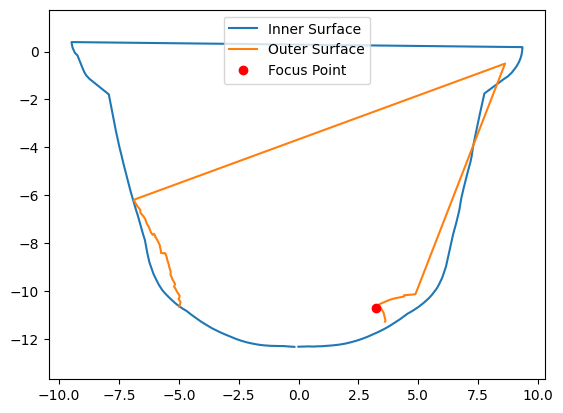

In [ ]:
import matplotlib.pyplot as plt

plt.plot(P_inner_2d_set[:,0], P_inner_2d_set[:,1], label='Inner Surface')
plt.plot(outer_surface[:,0], outer_surface[:,1], label='Outer Surface')
plt.plot(focus_point[0], focus_point[1], 'ro', label='Focus Point')
plt.axis('equal')
plt.legend()
plt.show()


Debug info:
run_lens_design() returned: <class 'tuple'>
Length of result: 6
outer_surface type: <class 'numpy.ndarray'>
outer_surface shape: (66, 2)
P_inner_2d_set_filtered type: <class 'numpy.ndarray'>
P_inner_2d_set_filtered shape: (66, 2)
focus_point type: <class 'numpy.ndarray'>
focus_point value: [  3.23916507 -10.69650745]
inner_surface_func type: <class 'scipy.interpolate._interpolate.interp1d'>
n1 value: 1.0
n2 value: 1.5

Lens Design Results:
Focus point: [3.239, -10.697]
Inner surface (filtered): 66 points
  X range: [0.155, 5.980]
  Y range: [-12.322, -9.483]
Outer surface: 66 points
  X range: [0.155, 5.980]
  Y range: [-12.064, -9.5]


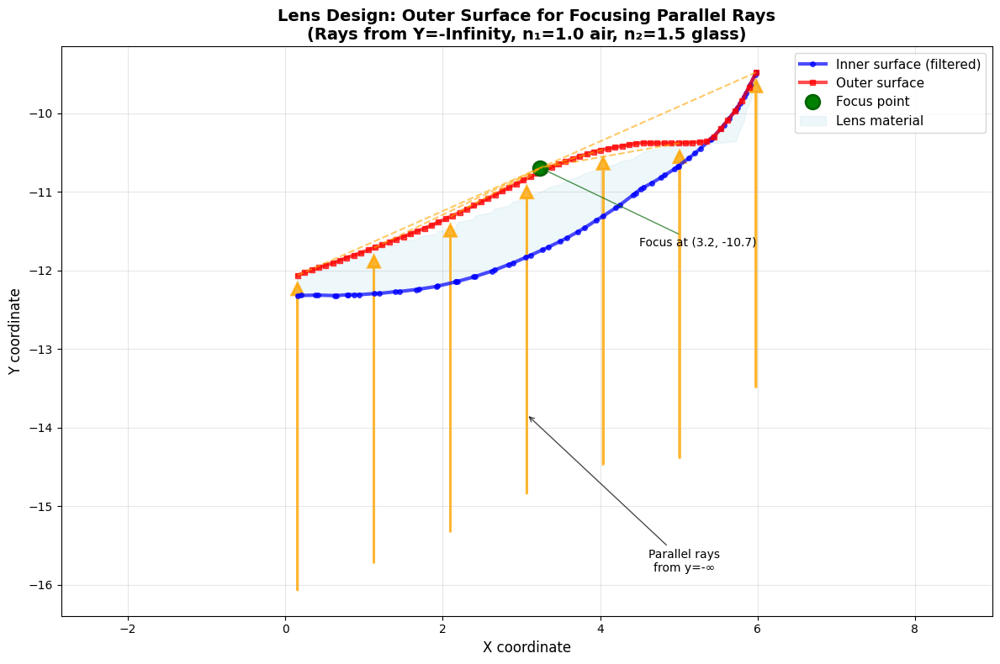

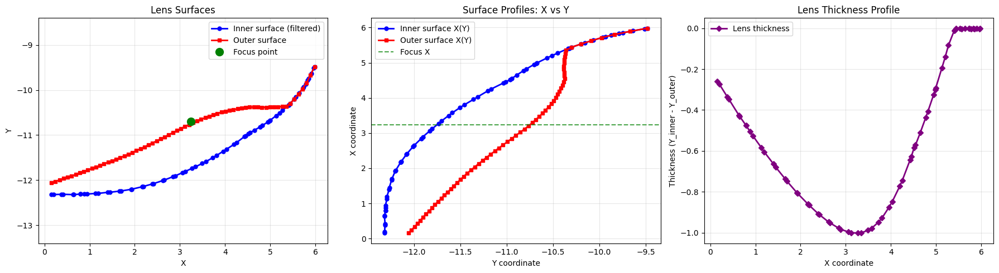

In [ ]:
# Jupyter notebook cell to plot lens design results
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.optimize import minimize_scalar

def calculate_lens_outer_surface(P_inner_2d_set, focus_point, n1, n2, x_rays=None, tolerance=1e-8):
    """
    Calculate the outer surface of a lens to focus parallel rays from y=-infinity onto a specified focus point.
    """
    # Create interpolation function for inner surface
    inner_y = P_inner_2d_set[:, 1]
    inner_x = P_inner_2d_set[:, 0]

    # Sort by x-coordinate for proper interpolation when rays are parallel to y-axis
    sort_idx = np.argsort(inner_x)
    inner_x_sorted = inner_x[sort_idx]
    inner_y_sorted = inner_y[sort_idx]


    # Create interpolation function (now Y is a function of X)
    inner_surface_func = interp1d(inner_x_sorted, inner_y_sorted,
                                  kind='cubic', bounds_error=False,
                                  fill_value='extrapolate')


    # Define x-coordinates for outer surface calculation (corresponding to ray positions)
    if x_rays is None:
        x_min, x_max = np.min(inner_x), np.max(inner_x)
        x_rays = np.linspace(x_min, x_max, len(P_inner_2d_set))


    outer_points = []

    def optical_path_equation(y_outer, x_ray):
        """
        Equation based on Fermat's principle: optical path length should be
        constant for all rays to focus at the same point.
        Rays are parallel to the y-axis, coming from y = -infinity.
        """
        # Point on outer surface
        outer_point = np.array([x_ray, y_outer]) # X is fixed for parallel rays, Y is variable

        # Find intersection with inner surface (inner_surface_func gives Y for a given X)
        y_inner = inner_surface_func(x_ray)
        inner_point = np.array([x_ray, y_inner])


        # Calculate distances
        # Distance traveled by incident ray (parallel to y-axis)
        dist_outside = abs(y_outer - np.min(y_rays)) # Assuming rays start at a common y (like min(y_rays) or just use abs(y_outer) if assuming reference at y=0)
        # Simpler: For parallel rays from y=-inf, distance is just the y-coordinate relative to a reference.
        # Let's assume the reference plane for zero path length is at some large negative Y.
        # The relevant part of the path length outside is proportional to the y-coordinate of the outer surface point.
        # We can use just y_outer for simplicity in the difference equation.

        dist_inside = np.linalg.norm(inner_point - outer_point)
        dist_to_focus = np.linalg.norm(focus_point - inner_point)


        # Optical path length (Constant K = n1 * (y_outer - y_ref) + n2 * dist_inside + n1 * dist_to_focus)
        # For minimizing the difference, we can ignore constant terms related to y_ref.
        # We are looking for K = n1 * y_outer + n2 * dist_inside + n1 * dist_to_focus
        # The objective is to find y_outer for each x_ray such that this K is constant.

        optical_path = n1 * y_outer + n2 * dist_inside + n1 * dist_to_focus
        return optical_path


    # Calculate reference optical path length using the middle point
    x_ref_idx = len(x_rays)//2
    x_ref = x_rays[x_ref_idx]
    y_inner_ref = inner_surface_func(x_ref)
    # We need an initial guess for y_outer_ref. Let's assume it's slightly above the inner surface point.
    y_outer_guess = y_inner_ref + 1.0 # Assuming lens is thicker on the bottom for focusing
    ref_optical_path = optical_path_equation(y_outer_guess, x_ref)

    # For each x-coordinate (ray position), find the corresponding y-coordinate on outer surface
    for x_ray in x_rays:
        try:
            def objective(y_outer):
                return abs(optical_path_equation(y_outer, x_ray) - ref_optical_path)

            # Find the y-coordinate that minimizes the optical path difference
            # Bounds for y_outer: It should be "above" the inner surface point (y_inner).
            # Let's set bounds relative to the inner surface at this x_ray.
            y_inner_at_x = inner_surface_func(x_ray)
            # Assuming the lens is between the outer surface (higher y) and inner surface (lower y)
            # And the focus point is "below" the inner surface in y.
            # So, y_outer should be > y_inner. A lower bound could be y_inner_at_x, upper bound some reasonable value.
            # Let's make the bounds relative to the inner surface point at x_ray
            bounds = (y_inner_at_x, y_inner_at_x + 10) # Example: allow outer surface to be up to 10 units above inner


            result = minimize_scalar(objective, bounds=bounds, method='bounded')


            if result.success:
                y_outer = result.x
            else:
                # Fallback if minimization fails
                y_outer = y_inner_at_x + 1.0 # Just place it a bit above the inner surface

            outer_points.append([x_ray, y_outer])


        except Exception as e:
            print(f"Warning: Could not find outer surface point for x={x_ray}: {e}")
            y_inner_at_x = inner_surface_func(x_ray)
            y_outer = y_inner_at_x + 1.0 # Fallback point
            outer_points.append([x_ray, y_outer])


    return np.array(outer_points), inner_surface_func # Also return the inner surface function

# Run the lens design function first to get the results
def run_lens_design(P_inner_2d_set ,focus_point):
    """
    Run the lens design and return the results for plotting
    """
    # Define a simple circular arc for the inner surface (concave)
 #   theta = np.linspace(-np.pi/3, np.pi/3, 20)
 #   radius = 5.0
 #   center_x = 2.0

    # Inner surface (concave)
 #   P_inner_2d_set = np.column_stack([
 #       center_x + radius * np.cos(theta),
 #       radius * np.sin(theta)
 #   ])

    # Filter P_inner_2d_set based on x-range [0, 6]
    x_min_filter = 0
    x_max_filter = 6
    filtered_P_inner_2d_set = P_inner_2d_set[
        (P_inner_2d_set[:, 0] >= x_min_filter) & (P_inner_2d_set[:, 0] <= x_max_filter)
    ]

    if len(filtered_P_inner_2d_set) == 0:
        print("Warning: No inner surface points found within the specified x-range.")
        return np.array([]), P_inner_2d_set, focus_point, None, 1.0, 1.5 # Return None for inner_surface_func and default n1, n2

    # Focus point
#    focus_point = np.array([0.0, 0.0])

    # Refractive indices
    n1 = 1.0  # air
    n2 = 1.5  # glass

    # Calculate outer surface using the function from the previous artifact
    outer_surface, inner_surface_func = calculate_lens_outer_surface( # Capture inner_surface_func
        filtered_P_inner_2d_set, focus_point, n1, n2
    )

    return outer_surface, filtered_P_inner_2d_set, focus_point, inner_surface_func, n1, n2 # Return inner_surface_func, n1, and n2

# Get the results
try:
    result = run_lens_design(P_inner_2d_set, focus_point)
    print("Debug info:")
    print(f"run_lens_design() returned: {type(result)}")
    print(f"Length of result: {len(result) if hasattr(result, '__len__') else 'No length'}")

    if isinstance(result, tuple) and len(result) == 6: # Expect 6 items now
        outer_surface, P_inner_2d_set_filtered, focus_point, inner_surface_func, n1, n2 = result # Capture inner_surface_func, n1, and n2
    else:
        print(f"Unexpected return format: {result}")
        raise ValueError("Function didn't return expected tuple")

    print(f"outer_surface type: {type(outer_surface)}")
    if hasattr(outer_surface, 'shape'):
        print(f"outer_surface shape: {outer_surface.shape}")
    else:
        print(f"outer_surface content: {outer_surface}")

    print(f"P_inner_2d_set_filtered type: {type(P_inner_2d_set_filtered)}")
    if hasattr(P_inner_2d_set_filtered, 'shape'):
        print(f"P_inner_2d_set_filtered shape: {P_inner_2d_set_filtered.shape}")
    else:
        print(f"P_inner_2d_set_filtered content: {P_inner_2d_set_filtered}")


    print(f"focus_point type: {type(focus_point)}")
    print(f"focus_point value: {focus_point}")

    print(f"inner_surface_func type: {type(inner_surface_func)}") # Print type of inner_surface_func
    print(f"n1 value: {n1}")
    print(f"n2 value: {n2}")


    print()

    # Ensure outer_surface is a numpy array
    if not isinstance(outer_surface, np.ndarray):
        print(f"Converting outer_surface from {type(outer_surface)} to numpy array")
        outer_surface = np.array(outer_surface)
        print(f"New outer_surface shape: {outer_surface.shape}")

except Exception as e:
    print(f"Error in run_lens_design(): {e}")
    import traceback
    traceback.print_exc()
    # Create dummy data for testing
    outer_surface = np.array([[-2, -3], [-1, 0], [-2, 3]])
    P_inner_2d_set_filtered = np.array([[2, -3], [3, 0], [2, 3]]) # Use filtered name for dummy
    focus_point = np.array([0, 0])
    inner_surface_func = None # Set to None for dummy data
    n1 = 1.0 # Define n1 and n2 for dummy case
    n2 = 1.5
    print("Using dummy data for plotting and setting inner_surface_func to None")


# --- Plotting ---
# Create a comprehensive plot
plt.figure(figsize=(12, 8))

# Plot the lens surfaces
# Plot inner surface (using filtered data for consistency with outer)
if P_inner_2d_set_filtered.size > 0:
    plt.plot(P_inner_2d_set_filtered[:, 0], P_inner_2d_set_filtered[:, 1], 'b-', linewidth=3,
             label='Inner surface (filtered)', marker='o', markersize=4, alpha=0.7)
else:
    print("No filtered inner surface points to plot.")

# Plot outer surface
if outer_surface.size > 0:
    plt.plot(outer_surface[:, 0], outer_surface[:, 1], 'r-', linewidth=3,
             label='Outer surface', marker='s', markersize=4, alpha=0.7)
else:
    print("No outer surface points to plot.")


# Plot the focus point
plt.plot(focus_point[0], focus_point[1], 'go', markersize=12,
         label='Focus point', markeredgewidth=2, markeredgecolor='darkgreen')

# Fill the lens area to visualize it better
# Check if both surfaces have points and same number of points along the axis for fill_between
if P_inner_2d_set_filtered.size > 0 and outer_surface.size > 0 and P_inner_2d_set_filtered.shape[0] == outer_surface.shape[0]:
     # Sort by x-coordinate for fill_betweenx (assuming fill is done along X)
    sort_idx_fill = np.argsort(P_inner_2d_set_filtered[:, 0])
    plt.fill_between(P_inner_2d_set_filtered[sort_idx_fill, 0], outer_surface[sort_idx_fill, 1], P_inner_2d_set_filtered[sort_idx_fill, 1],
                     alpha=0.2, color='lightblue', label='Lens material')
elif P_inner_2d_set_filtered.size > 0 and outer_surface.size > 0:
     # If point counts differ, interpolate one to match the other for filling.
     # Interpolate outer surface y-coordinates onto inner surface x-coordinates
     try:
         outer_interp_for_fill = interp1d(outer_surface[:, 0], outer_surface[:, 1],
                                          kind='linear', bounds_error=False,
                                          fill_value=(outer_surface[0,1], outer_surface[-1,1]))
         sort_idx_fill = np.argsort(P_inner_2d_set_filtered[:, 0])
         plt.fill_between(P_inner_2d_set_filtered[sort_idx_fill, 0],
                          outer_interp_for_fill(P_inner_2d_set_filtered[sort_idx_fill, 0]),
                          P_inner_2d_set_filtered[sort_idx_fill, 1],
                          alpha=0.2, color='lightblue', label='Lens material')
     except Exception as e:
         print(f"Warning: Could not fill lens area due to interpolation issue: {e}")
else:
    print("Not enough points to fill lens area.")


# Add some parallel rays for visualization (coming from y=-Infinity, parallel to Y-axis)
# Use x-range of the outer surface for ray visualization
if outer_surface.size > 0:
    x_rays_viz = np.linspace(np.min(outer_surface[:, 0]), np.max(outer_surface[:, 0]), 7)
    outer_interp_viz = interp1d(outer_surface[:, 0], outer_surface[:, 1],
                           kind='linear', fill_value='extrapolate') # Interpolate outer surface Y based on its X values

    for i, x in enumerate(x_rays_viz):
        y_start = outer_interp_viz(x) - 4 # Start the ray below the outer surface
        y_outer = outer_interp_viz(x)

        # Incident ray (from below, parallel to y-axis)
        plt.arrow(x, y_start, 0, y_outer - y_start - 0.1, # dx=0, dy points upwards
                 head_width=0.15, head_length=0.15, fc='orange', ec='orange',
                 alpha=0.8, linewidth=2, shape='full', length_includes_head=True)

        # Ray inside lens (simplified - straight line to focus)
        # The ray enters at (x, y_outer) and goes towards focus_point (focus_point[0], focus_point[1])
        plt.plot([x, focus_point[0]], [y_outer, focus_point[1]],
                'orange', alpha=0.6, linestyle='--', linewidth=1.5)
else:
    print("Not enough outer surface points to visualize rays.")


# Customize the plot
plt.grid(True, alpha=0.3)
plt.xlabel('X coordinate', fontsize=12)
plt.ylabel('Y coordinate', fontsize=12)
plt.title('Lens Design: Outer Surface for Focusing Parallel Rays\n(Rays from Y=-Infinity, n₁=1.0 air, n₂=1.5 glass)',
          fontsize=14, fontweight='bold')
plt.legend(fontsize=11, loc='upper right')
plt.axis('equal')

# Add annotations
if outer_surface.size > 0:
    x_mid_outer = np.mean([np.min(outer_surface[:, 0]), np.max(outer_surface[:, 0])])
    y_outer_mid = outer_interp_viz(x_mid_outer)
    plt.annotate('Parallel rays\nfrom y=-∞', xy=(x_mid_outer, y_outer_mid - 3), xytext=(x_mid_outer + 2, y_outer_mid - 5),
                arrowprops=dict(arrowstyle='->', color='black', alpha=0.7),
                fontsize=10, ha='center')

if focus_point is not None:
    plt.annotate(f'Focus at ({focus_point[0]:.1f}, {focus_point[1]:.1f})',
                xy=(focus_point[0], focus_point[1]), xytext=(focus_point[0]+2, focus_point[1]-1),
                arrowprops=dict(arrowstyle='->', color='darkgreen', alpha=0.7),
                fontsize=10, ha='center')


# Show data points info
print("Lens Design Results:")
if focus_point is not None:
    print(f"Focus point: [{focus_point[0]:.3f}, {focus_point[1]:.3f}]")
if P_inner_2d_set_filtered.size > 0:
    print(f"Inner surface (filtered): {len(P_inner_2d_set_filtered)} points")
    print(f"  X range: [{np.min(P_inner_2d_set_filtered[:, 0]):.3f}, {np.max(P_inner_2d_set_filtered[:, 0]):.3f}]")
    print(f"  Y range: [{np.min(P_inner_2d_set_filtered[:, 1]):.3f}, {np.max(P_inner_2d_set_filtered[:, 1]):.3f}]") # Corrected variable name
if outer_surface.size > 0:
    print(f"Outer surface: {len(outer_surface)} points")
    print(f"  X range: [{np.min(outer_surface[:, 0]):.3f}, {np.max(outer_surface[:, 0]):.3f}]")
    print(f"  Y range: [{np.min(outer_surface[:, 1]):.3f}, {np.max(outer_surface[:, 1]):.1f}]")


plt.tight_layout()
plt.show()

# Additional detailed plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Plot 1: Surfaces only
if P_inner_2d_set_filtered.size > 0:
    axes[0].plot(P_inner_2d_set_filtered[:, 0], P_inner_2d_set_filtered[:, 1], 'b-o', linewidth=2,
                markersize=5, label='Inner surface (filtered)')
if outer_surface.size > 0:
    axes[0].plot(outer_surface[:, 0], outer_surface[:, 1], 'r-s', linewidth=2,
                markersize=5, label='Outer surface')
if focus_point is not None:
    axes[0].plot(focus_point[0], focus_point[1], 'go', markersize=10, label='Focus point')
axes[0].grid(True, alpha=0.3)
axes[0].set_xlabel('X')
axes[0].set_ylabel('Y')
axes[0].set_title('Lens Surfaces')
axes[0].legend()
axes[0].axis('equal')

# Plot 2: Surface coordinates vs Y
if P_inner_2d_set_filtered.size > 0:
    axes[1].plot(P_inner_2d_set_filtered[:, 1], P_inner_2d_set_filtered[:, 0], 'b-o', linewidth=2,
                markersize=5, label='Inner surface X(Y)')
if outer_surface.size > 0:
    axes[1].plot(outer_surface[:, 1], outer_surface[:, 0], 'r-s', linewidth=2,
                markersize=5, label='Outer surface X(Y)')
if focus_point is not None:
    axes[1].axhline(focus_point[0], color='green', linestyle='--', alpha=0.7, label='Focus X')
axes[1].grid(True, alpha=0.3)
axes[1].set_xlabel('Y coordinate')
axes[1].set_ylabel('X coordinate')
axes[1].set_title('Surface Profiles: X vs Y')
axes[1].legend()

# Plot 3: Lens thickness
# Interpolate outer_surface to match the y-coordinates of P_inner_2d_set_filtered for thickness calculation
if P_inner_2d_set_filtered.size > 0 and outer_surface.size > 0 and P_inner_2d_set_filtered.shape[0] == outer_surface.shape[0]:
    # Sort by x-coordinate to align points for thickness calculation along X
    sort_idx_thickness = np.argsort(P_inner_2d_set_filtered[:, 0])
    outer_y_interp_for_thickness = interp1d(outer_surface[:, 0], outer_surface[:, 1],
                                          kind='linear', bounds_error=False,
                                          fill_value=(outer_surface[0,1], outer_surface[-1,1]))
    thickness = P_inner_2d_set_filtered[sort_idx_thickness, 1] - outer_y_interp_for_thickness(P_inner_2d_set_filtered[sort_idx_thickness, 0])
    axes[2].plot(P_inner_2d_set_filtered[sort_idx_thickness, 0], thickness, 'purple', linewidth=2, marker='D', # Plot thickness vs X
                markersize=5, label='Lens thickness')
    axes[2].set_xlabel('X coordinate') # Changed xlabel for thickness plot
    axes[2].set_ylabel('Thickness (Y_inner - Y_outer)') # Changed ylabel for thickness plot
elif P_inner_2d_set_filtered.size > 0 and outer_surface.size > 0:
     print("Cannot plot thickness directly due to different point counts after filtering.")
     # You could add an interpolated thickness plot here if needed, similar to the fill_between handling.
else:
    print("Not enough points to plot thickness.")

axes[2].grid(True, alpha=0.3)
axes[2].set_title('Lens Thickness Profile')
axes[2].legend()

plt.tight_layout()
plt.show()

# Print the actual coordinate data
#print("\nInner surface coordinates (P_inner_2d_set_filtered):")
#print("X coordinates:", P_inner_2d_set_filtered[:, 0])
#print("Y coordinates:", P_inner_2d_set_filtered[:, 1])

#print("\nOuter surface coordinates:")
#print("X coordinates:", outer_surface[:, 0])
#print("Y coordinates:", outer_surface[:, 1])
#print(f"\nFocus point: [{focus_point[0]}, {focus_point[1]}]")